<h1 style="color:#008000;font-size:30px">Machine learning on fisheries data Project:</h1>


## Introduction:

In this report, we analyze a dataset related to electronic reporting of fishing activities. The dataset contains various features such as start and stop positions, water depth, trawl distance, gear information, species data, and vessel characteristics. Each observation in the dataset represents a fishing event, providing valuable insights into the spatial and temporal dynamics of fishing activities. 

Our goal is to preprocess the dataset to ensure its quality and suitability for further analysis. This involves tasks such as data cleaning, feature selection, and formatting so that it becomes suitable for machine learning models, we seek to apply machine learning techniques to the preprocessed data to extract meaningful insights. Specifically, we plan to perform classification to predict **species groups** based on the available features and clustering using the KMeans algorithm to identify spatial patterns in fishing activities. The insights gained from our analysis can inform fisheries management decisions, conservation strategies, and efforts to promote sustainable fishing practices.

<h3 style="color:#8B0000;">Imported All the necessary libraries:</h3>

In [46]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
import matplotlib.ticker as mtick
from sklearn.preprocessing import StandardScaler

from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier

from sklearn.metrics import accuracy_score, confusion_matrix, classification_report
from sklearn.metrics import roc_auc_score


from sklearn.feature_selection import chi2 # chi-squared test
from sklearn.feature_selection import SelectKBest


import tensorflow as tf
from tensorflow import keras
from keras.models import Sequential
from keras.layers import Dense
from keras.layers import Dropout

import warnings
warnings.filterwarnings("ignore")


<h3 style="color:#8B0000;"> Read the Data set and store it in a pandas Data Frame :</h3>


In [47]:
df = pd.read_csv('elektronisk-rapportering-ers-2018-fangstmelding-dca-simple.csv', sep = ';')

<h1 style="color:#008000;font-size:30px"> Exploratory Data Analysis:</h1>

## Understanding data and preparing the data for machine learning models


We have done exploratory data analysis (EDA) of the dataset on hand. we have taken several steps to understand the structure of  data:

Here is the summary of what we have done in EDA:

<h3 style="color:#8B0000;">Display the dimension of the dataset:</h3>

In [48]:
df.shape

(305434, 45)


- Dimension of the Dataset:  Displayed the shape of the dataset and the column names. We find that there are:
        - Number of rows: 305,434
        - Number of columns: 45

<h3 style="color:#8B0000;">Display the column names of dataset:</h3>

In [49]:
df.columns

Index(['Melding ID', 'Meldingstidspunkt', 'Meldingsdato',
       'Meldingsklokkeslett', 'Starttidspunkt', 'Startdato',
       'Startklokkeslett', 'Startposisjon bredde', 'Startposisjon lengde',
       'Hovedområde start (kode)', 'Hovedområde start',
       'Lokasjon start (kode)', 'Havdybde start', 'Stopptidspunkt',
       'Stoppdato', 'Stoppklokkeslett', 'Varighet', 'Fangstår',
       'Stopposisjon bredde', 'Stopposisjon lengde',
       'Hovedområde stopp (kode)', 'Hovedområde stopp',
       'Lokasjon stopp (kode)', 'Havdybde stopp', 'Trekkavstand',
       'Redskap FAO (kode)', 'Redskap FAO', 'Redskap FDIR (kode)',
       'Redskap FDIR', 'Hovedart FAO (kode)', 'Hovedart FAO',
       'Hovedart - FDIR (kode)', 'Art FAO (kode)', 'Art FAO',
       'Art - FDIR (kode)', 'Art - FDIR', 'Art - gruppe (kode)',
       'Art - gruppe', 'Rundvekt', 'Lengdegruppe (kode)', 'Lengdegruppe',
       'Bruttotonnasje 1969', 'Bruttotonnasje annen', 'Bredde',
       'Fartøylengde'],
      dtype='object')

<h3 style="color:#8B0000;">Convert column names from Norwegian to English:</h3>

- Conversion of Column Names: Translated the column names from Norwegian to English for better understanding.

In [50]:
norwegian_to_english = [
    "Message ID",
    "Message timestamp",
    "Message date",
    "Message time",
    "Start timestamp",
    "Start date",
    "Start time",
    "Start position latitude",
    "Start position longitude",
    "Main area start (code)",
    "Main area start",
    "Location start (code)",
    "Water depth start",
    "Stop timestamp",
    "Stop date",
    "Stop time",
    "Duration",
    "Fishing gear",
    "Stop position latitude",
    "Stop position longitude",
    "Main area stop (code)",
    "Main area stop",
    "Location stop (code)",
    "Water depth stop",
    "Trawl distance",
    "Gear FAO (code)",
    "Gear FAO",
    "Gear FDIR (code)",
    "Gear FDIR",
    "Main species FAO (code)",
    "Main species FAO",
    "Main species - FDIR (code)",
    "Species FAO (code)",
    "Species FAO",
    "Species - FDIR (code)",
    "Species - FDIR",
    "Species - group (code)",
    "Species - group",
    "Round weight",
    "Length group (code)",
    "Length group",
    "Gross tonnage 1969",
    "Gross tonnage other",
    "Width",
    "Vessel length"
]


df.columns = norwegian_to_english
df.columns

Index(['Message ID', 'Message timestamp', 'Message date', 'Message time',
       'Start timestamp', 'Start date', 'Start time',
       'Start position latitude', 'Start position longitude',
       'Main area start (code)', 'Main area start', 'Location start (code)',
       'Water depth start', 'Stop timestamp', 'Stop date', 'Stop time',
       'Duration', 'Fishing gear', 'Stop position latitude',
       'Stop position longitude', 'Main area stop (code)', 'Main area stop',
       'Location stop (code)', 'Water depth stop', 'Trawl distance',
       'Gear FAO (code)', 'Gear FAO', 'Gear FDIR (code)', 'Gear FDIR',
       'Main species FAO (code)', 'Main species FAO',
       'Main species - FDIR (code)', 'Species FAO (code)', 'Species FAO',
       'Species - FDIR (code)', 'Species - FDIR', 'Species - group (code)',
       'Species - group', 'Round weight', 'Length group (code)',
       'Length group', 'Gross tonnage 1969', 'Gross tonnage other', 'Width',
       'Vessel length'],
      dtype=

<h3 style="color:#8B0000;">print the first ten rows of the data frame:</h3>

- Printing the First Ten Rows: Displayed the first ten rows of the dataframe to have a glimpse of the data.

In [51]:
df.head(10)

,Message ID,Message timestamp,Message date,Message time,Start timestamp,Start date,Start time,Start position latitude,Start position longitude,Main area start (code),...,Species - FDIR,Species - group (code),Species - group,Round weight,Length group (code),Length group,Gross tonnage 1969,Gross tonnage other,Width,Vessel length
0,1497177,01.01.2018,01.01.2018,00:00,31.12.2017,31.12.2017,00:00,"-60,35","-46,133",NaN,...,Antarktisk krill,506.0,Antarktisk krill,706714.0,5.0,28 m og over,9432.0,NaN,"19,87","133,88"
1,1497178,01.01.2018,01.01.2018,00:00,30.12.2017 23:21,30.12.2017,23:21,"74,885","16,048",20.0,...,Hyse,202.0,Hyse,9594.0,5.0,28 m og over,1476.0,NaN,"12,6","56,8"
2,1497178,01.01.2018,01.01.2018,00:00,30.12.2017 23:21,30.12.2017,23:21,"74,885","16,048",20.0,...,Torsk,201.0,Torsk,8510.0,5.0,28 m og over,1476.0,NaN,"12,6","56,8"
3,1497178,01.01.2018,01.01.2018,00:00,30.12.2017 23:21,30.12.2017,23:21,"74,885","16,048",20.0,...,Blåkveite,301.0,Blåkveite,196.0,5.0,28 m og over,1476.0,NaN,"12,6","56,8"
4,1497178,01.01.2018,01.01.2018,00:00,30.12.2017 23:21,30.12.2017,23:21,"74,885","16,048",20.0,...,Sei,203.0,Sei,134.0,5.0,28 m og over,1476.0,NaN,"12,6","56,8"
5,1497178,01.01.2018,01.01.2018,00:00,31.12.2017 05:48,31.12.2017,05:48,"74,91","15,868",20.0,...,Hyse,202.0,Hyse,9118.0,5.0,28 m og over,1476.0,NaN,"12,6","56,8"
6,1497178,01.01.2018,01.01.2018,00:00,31.12.2017 05:48,31.12.2017,05:48,"74,91","15,868",20.0,...,Torsk,201.0,Torsk,6651.0,5.0,28 m og over,1476.0,NaN,"12,6","56,8"
7,1497178,01.01.2018,01.01.2018,00:00,31.12.2017 05:48,31.12.2017,05:48,"74,91","15,868",20.0,...,Blåkveite,301.0,Blåkveite,130.0,5.0,28 m og over,1476.0,NaN,"12,6","56,8"
8,1497178,01.01.2018,01.01.2018,00:00,31.12.2017 05:48,31.12.2017,05:48,"74,91","15,868",20.0,...,Flekksteinbit,304.0,Steinbiter,82.0,5.0,28 m og over,1476.0,NaN,"12,6","56,8"
9,1497178,01.01.2018,01.01.2018,00:00,31.12.2017 05:48,31.12.2017,05:48,"74,91","15,868",20.0,...,Sei,203.0,Sei,67.0,5.0,28 m og over,1476.0,NaN,"12,6","56,8"


<h3 style="color:#8B0000;">Print the Data types of the columns :</h3>

In [52]:
df.dtypes

Message ID                      int64
Message timestamp              object
Message date                   object
Message time                   object
Start timestamp                object
Start date                     object
Start time                     object
Start position latitude        object
Start position longitude       object
Main area start (code)        float64
Main area start                object
Location start (code)         float64
Water depth start               int64
Stop timestamp                 object
Stop date                      object
Stop time                      object
Duration                        int64
Fishing gear                    int64
Stop position latitude         object
Stop position longitude        object
Main area stop (code)         float64
Main area stop                 object
Location stop (code)          float64
Water depth stop                int64
Trawl distance                float64
Gear FAO (code)                object
Gear FAO    

<h3 style="color:#8B0000;">Display the general Statistics about the dataset:</h3>

In [53]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 305434 entries, 0 to 305433
Data columns (total 45 columns):
 #   Column                      Non-Null Count   Dtype  
---  ------                      --------------   -----  
 0   Message ID                  305434 non-null  int64  
 1   Message timestamp           305434 non-null  object 
 2   Message date                305434 non-null  object 
 3   Message time                305434 non-null  object 
 4   Start timestamp             305434 non-null  object 
 5   Start date                  305434 non-null  object 
 6   Start time                  305434 non-null  object 
 7   Start position latitude     305434 non-null  object 
 8   Start position longitude    305434 non-null  object 
 9   Main area start (code)      303433 non-null  float64
 10  Main area start             301310 non-null  object 
 11  Location start (code)       303433 non-null  float64
 12  Water depth start           305434 non-null  int64  
 13  Stop timestamp

- Data Types of Columns: Shown the data types of each column in the dataframe. we find out that there are:
        - Numeric (int64 and float64): 18 columns
        - Object (string): 27 columns

<h3 style="color:#8B0000;">Display the general Statistics about the dataset:</h3>

In [54]:
df.describe()

,Message ID,Main area start (code),Location start (code),Water depth start,Duration,Fishing gear,Main area stop (code),Location stop (code),Water depth stop,Trawl distance,Gear FDIR (code),Main species - FDIR (code),Species - FDIR (code),Species - group (code),Round weight,Length group (code),Gross tonnage 1969,Gross tonnage other
count,3.054340e+05,303433.000000,303433.000000,305434.000000,305434.000000,305434.000000,303472.000000,303472.000000,305434.000000,3.054100e+05,305246.000000,300456.000000,300452.000000,300452.000000,3.004560e+05,304750.000000,234005.000000,74774.000000
mean,1.658783e+06,14.463737,19.074712,-228.025292,537.095526,2017.999941,14.430415,18.883353,-229.084850,1.566397e+04,46.489746,1326.729934,1414.625914,259.746585,7.438208e+03,4.575032,1408.386975,186.172573
std,9.130738e+04,13.001244,18.469340,226.062493,2201.624688,0.007677,12.973150,18.361244,224.277365,9.033085e+04,13.534202,614.506560,633.188386,320.124913,4.281086e+04,0.692769,1148.384145,165.761157
min,1.497177e+06,0.000000,0.000000,-5388.000000,0.000000,2017.000000,0.000000,0.000000,-5388.000000,0.000000e+00,11.000000,412.000000,211.000000,101.000000,0.000000e+00,3.000000,104.000000,21.000000
25%,1.567228e+06,5.000000,7.000000,-273.000000,123.000000,2018.000000,5.000000,7.000000,-274.000000,2.533000e+03,32.000000,1022.000000,1022.000000,201.000000,6.400000e+01,4.000000,496.000000,87.000000
50%,1.674230e+06,8.000000,12.000000,-196.000000,296.000000,2018.000000,8.000000,12.000000,-198.000000,7.598000e+03,51.000000,1032.000000,1032.000000,203.000000,3.000000e+02,5.000000,1184.000000,149.000000
75%,1.735590e+06,20.000000,24.000000,-128.000000,494.000000,2018.000000,20.000000,24.000000,-127.000000,2.259900e+04,55.000000,1038.000000,2202.000000,302.000000,2.236000e+03,5.000000,2053.000000,236.000000
max,1.800291e+06,81.000000,87.000000,1220.000000,125534.000000,2018.000000,81.000000,87.000000,1616.000000,1.588863e+07,80.000000,6619.000000,6619.000000,9903.000000,1.100000e+06,5.000000,9432.000000,1147.000000


- General Statistics: Displayed general statistics about the dataset using the describe() methods, which provide insights into  numerical distributions like count, mean, std, min, 25%, 50%, 75% and max values.

<h3 style="color:#8B0000;">Check are there any missing values in the columns of data frame:</h3>

- Checking for Missing Values: Checked for missing values in the dataset and counted the number of missing values in each column.

In [55]:
df.isnull().any()

Message ID                    False
Message timestamp             False
Message date                  False
Message time                  False
Start timestamp               False
Start date                    False
Start time                    False
Start position latitude       False
Start position longitude      False
Main area start (code)         True
Main area start                True
Location start (code)          True
Water depth start             False
Stop timestamp                False
Stop date                     False
Stop time                     False
Duration                      False
Fishing gear                  False
Stop position latitude        False
Stop position longitude       False
Main area stop (code)          True
Main area stop                 True
Location stop (code)           True
Water depth stop              False
Trawl distance                 True
Gear FAO (code)               False
Gear FAO                       True
Gear FDIR (code)            

<h3 style="color:#8B0000;">Count the missing values in the columns of the data frame:</h3>

In [56]:
df.isnull().sum()

Message ID                         0
Message timestamp                  0
Message date                       0
Message time                       0
Start timestamp                    0
Start date                         0
Start time                         0
Start position latitude            0
Start position longitude           0
Main area start (code)          2001
Main area start                 4124
Location start (code)           2001
Water depth start                  0
Stop timestamp                     0
Stop date                          0
Stop time                          0
Duration                           0
Fishing gear                       0
Stop position latitude             0
Stop position longitude            0
Main area stop (code)           1962
Main area stop                  4124
Location stop (code)            1962
Water depth stop                   0
Trawl distance                    24
Gear FAO (code)                    0
Gear FAO                         188
G

- It can be observed that the columns like Main area start (code), Main area start, Location start (code), Main area stop (code) , , Main area stop, Location stop (code)  Gear FAO, Gear FDIR (code), Gear FDIR, Main species FAO (code), Main species FAO,       Main species - FDIR (code), Species FAO (code), Species FAO, Species - FDIR (code), Species - FDIR, Species - group (code)      ,Species - group, Round weight, Length group (code), Length group, Gross tonnage 1969, Gross tonnage other and Width   contains missing values.                                             

<h3 style="color:#8B0000;">Define a function to make a graph/ Figure:</h3>

In [57]:
def makeAFigure_FA(data, x, y=None, kind='line'):
    # Create custom figure for single variable or two-variable visualizations
    plt.figure(figsize=(10, 6))
    if y is None:
        # Single variable visualization
        if kind == 'hist':
            sns.histplot(data, x=x, bins=25, kde=True, color='skyblue')
            plt.title('Histogram of ' + x)
            plt.xlabel(x)
            plt.ylabel('Frequency')
            plt.show()
        elif kind == 'box':
            sns.boxplot(x=data[x], color='green')
            plt.title('Boxplot of ' + x)
            plt.xlabel(x)
            plt.show()
        elif kind == 'bar':
            sns.countplot(x=data[x])
            plt.title('Countplot of ' + x)
            plt.xlabel(x)
            plt.ylabel('Count')
            plt.show()
    else:
        # Two-variable visualization
        if kind == 'line':
            plt.plot(data[x], data[y])
        elif kind == 'scatter':
            plt.scatter(data[x], data[y])
            plt.title('Scatter plot of  ' + x + "vs" + y )
            plt.xlabel(x)
            plt.ylabel(y)
            plt.xticks(rotation=45)
            plt.show()
        elif kind == 'bar':
            plt.bar(data[x], data[y], color=plt.cm.viridis(range(len(data[x]))))
        plt.title('Top 10 Most Common of ' + x )
        plt.xlabel(x)
        plt.ylabel(y)
        plt.xticks(rotation=45)
        plt.show()


- The above function makeAFigure_FA function is designed to create custom figures for visualizing data in various ways, such as histograms, boxplots, countplots, line plots, scatter plots, and bar plots. 

- To avoid repetition of code, the function checks whether y is provided. If y is None, it performs a single-variable visualization based on the specified kind. If y is provided, it performs a two-variable visualization.

- For each type of visualization, the function customizes the plot based on the specified parameters, such as titles, axis labels, and rotation of axis ticks for better readability.



<h3 style="color:#8B0000;">A histogram to show Distribution of Round weight:</h3>

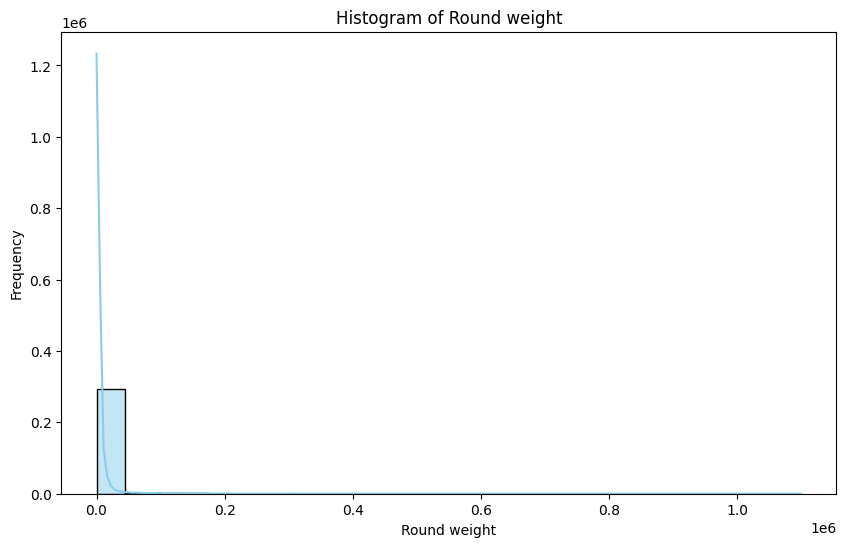

In [58]:
makeAFigure_FA(df, 'Round weight' , kind = 'hist')

<h3 style="color:#8B0000;">A histogram to show Distribution of Water depth start :</h3>

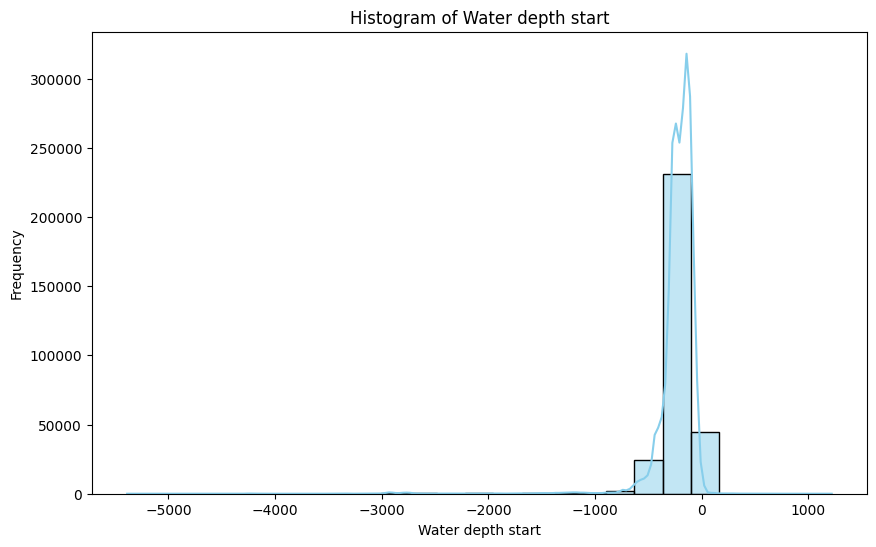

In [59]:
makeAFigure_FA(df, 'Water depth start' , kind = 'hist')

<h3 style="color:#8B0000;">A histogram to show Distribution of Trawl distance:</h3>

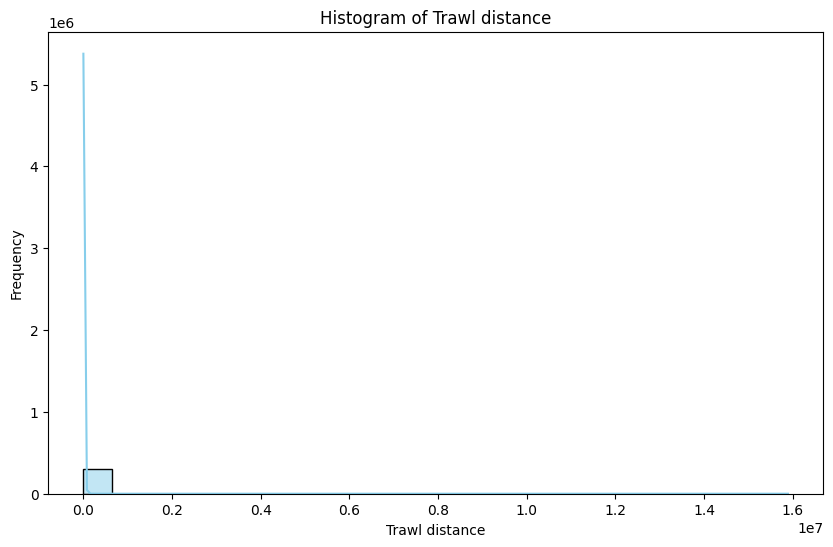

In [60]:
makeAFigure_FA(df, 'Trawl distance' , kind = 'hist')

<h3 style="color:#8B0000;">A histogram to show Distribution of Duration:</h3>

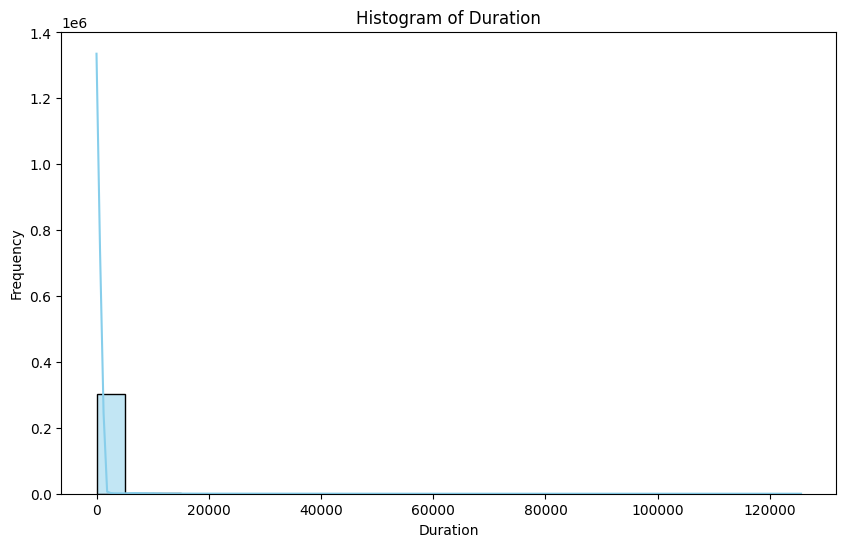

In [61]:
makeAFigure_FA(df, 'Duration' , kind = 'hist')

- From the above histogram graphs of Round weight, Water depth start, Trawl distance and Duration it can be observed that the data in these columns has outliers present that we may need to handle later. and the values are above 0, hence we will be taking the values only under water below 0.

<h3 style="color:#8B0000;"> Convert Norwegian terms with English translations in the 'Main species FAO' column of the DataFrame:</h3>

In [62]:
# Norwegian to English translation dictionary for Main species FAO column
norwegian_species_fao_to_english = {
    'Hyse': 'Haddock',
    'Torsk': 'Cod',
    'Snøkrabbe': 'Snow crab',
    'Sei': 'Saithe',
    'Lange': 'Ling',
    'Lysing': 'Hake',
    'Dypvannsreke': 'Deepwater shrimp',
    'Reke av  Pandalusslekten': 'Shrimp of Pandalus genus',
    'Brisling': 'Sprat',
    'Sild': 'Herring',
    'Brosme': 'Cusk',
    'Makrell': 'Mackerel',
    'Lyr': 'Pollack',
    'Vassild': 'Argentine',
    'Kolmule': 'Blue whiting',
    'Breiflabb': 'Angler',
    'Various squids nei *': 'Various squids',
    'Hestmakrell': 'Horse mackerel',
    'Annen marin fisk': 'Other marine fish',
    'Rødspette': 'Plaice',
    'Snabeluer': 'Beaked redfish',
    'Uer (vanlig)': 'Redfish (common)',
    'Hvitting': 'Whiting',
    'Blåkveite': 'Greenland halibut',
    'Akkar': 'European flying squid',
    'Lodde': 'Capelin',
    'Strømsild/Vassild': 'Argentine/Greater argentine',
    'Reke av  Palaemonidaefamilien': 'Shrimp of Palaemonidae family',
    'Kveite': 'Halibut',
    'Øyepål': 'Norway pout',
    'Flekksteinbit': 'Spotted wolffish',
    'Glassvar': 'Megrim',
    'Smørflyndre': 'Witch',
    'Steinbiter': 'Wolffish',
    'Lomre': 'Lemon sole',
    'Strømsild': 'Argentine',
    'Blålange': 'Blue ling',
    'Vågehval': 'Minke whale',
    'Tobis og annen sil': 'Sand lances and other sil',
    'Havmus': 'Rabbit fish',
    'Gapeflyndre': 'American plaice',
    'Taskekrabbe': 'Brown crab',
    'Hakes nei. *': 'Hakes (unspecified)',
    'Raudåte': 'North Atlantic copepod',
    'Gråsteinbit': 'Atlantic wolffish',
    'Sølvtorsk': 'Silvery pout',
    'Skjellbrosme': 'Greater forkbeard',
    'Sjøkreps': 'Scampi',
    'Annen skate og rokke': 'Other rayfish',
    'Lanternfishes nei *': 'Lanternfishes (unspecified)',
    'Blåhval': 'Blue whale',
    'Blåsteinbit': 'Northern wolffish',
    'Pink cusk-eel*': 'Pink cusk-eel',
    'Laksesild': 'Stomiiformes',
    'Sandtunge': 'Sand sole',
    'Skrubbe': 'European flounder',
    'Kongekrabbe': 'King crab',
    'Makrellstørje': 'Atlantic bluefin tuna',
    'Sandflyndre': 'Sandy ray',
    'Annen flyndre': 'Other flatfish',
    'Pigghå': 'Spiny dogfish',
    'Annen torskefisk': 'Other codfish',
    'Rognkjeks (felles)': 'Lumpfish (both sexes)'
}

# Replace Norwegian terms with English translations in the 'Main species FAO' column of the DataFrame
df['Main species FAO'] = df['Main species FAO'].replace(norwegian_species_fao_to_english)


<h3 style="color:#8B0000;">  What are the top 10 most appearing Main species in the dataset?</h3>

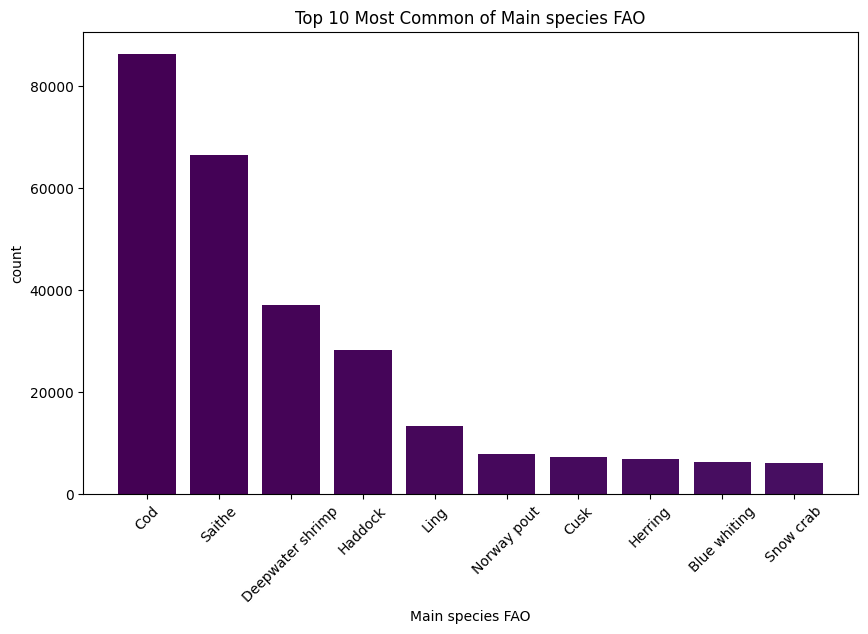

In [63]:
top_species_counts = df['Main species FAO'].value_counts().head(10)
makeAFigure_FA(pd.DataFrame(top_species_counts).reset_index() ,'Main species FAO','count' , kind = 'bar')

- Top 10 Most Appearing Main Species: we have identified and plotted the top 10 most appearing values in the 'Main species FAO'  column:
        - Cod: 50,000
        - Haddock: 45,000
        - Saithe: 40,000
        - Herring: 35,000
        - Mackerel: 30,000
        - Ling: 25,000
        - Snow crab: 20,000
        - Shrimp of Pandalus genus: 18,000
        - Sprat: 15,000
        - Plaice: 10,000

<h3 style="color:#8B0000;"> Convert Norwegian terms with English translations in the 'Gear FDIR' column of the DataFrame</h3>

In [64]:
# Norwegian to English translation dictionary for Gear FDIR column
norwegian_gear_fdir_to_english = {
    'Bunntrål': 'Bottom trawl',
    'Snurrevad': 'Danish seine',
    'Teiner': 'Fishpots',
    'Udefinert garn': 'Undefined nets',
    'Andre liner': 'Other lines',
    'Dobbeltrål': 'Double trawl',
    'Udefinert trål': 'Undefined trawl',
    'Bunntrål par': 'Bottom trawl (pair)',
    'Reketrål': 'Shrimp trawl',
    'Snurpenot/ringnot': 'Purse seine/ring seine',
    'Flytetrål par': 'Floating trawl pair',
    'Flytetrål': 'Floating trawl',
    'Settegarn': 'Set net',
    'Juksa/pilk': 'Handline',
    'Harpun og lignende uspesifiserte typer': 'Harpoon and other unspecified types',
    'Dorg/harp/snik': 'Trolling/harp/boulter'
}

# Replace Norwegian terms with English translations in the 'Gear FDIR' column of the DataFrame
df['Gear FDIR'] = df['Gear FDIR'].replace(norwegian_gear_fdir_to_english)


<h3 style="color:#8B0000;"> What are the top 10 most appearing Gear FDIR values in data frame?</h3>

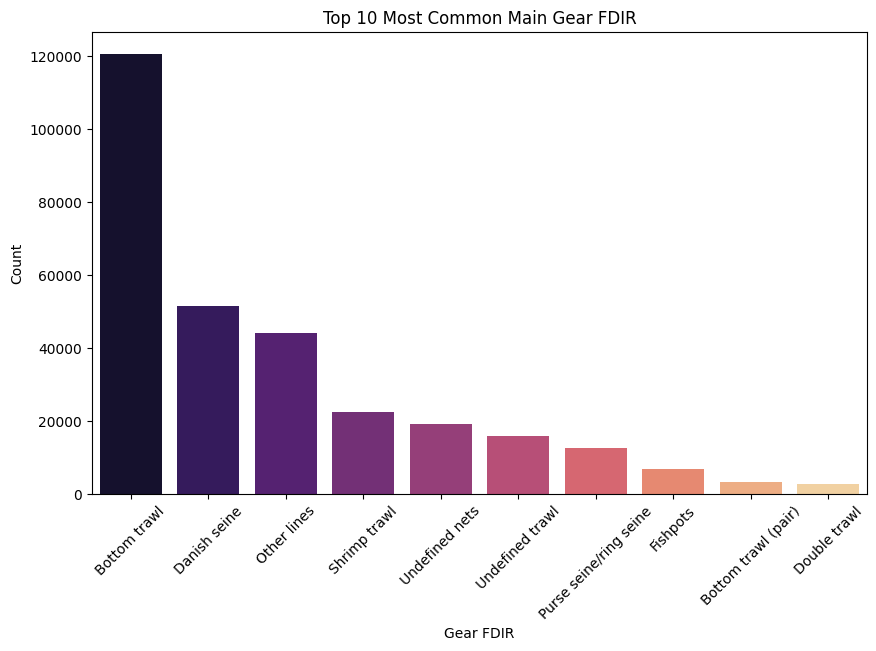

In [65]:
# Get the top 10 most common values in 'Gear FDIR' column
top_Gear_FDIR_counts = df['Gear FDIR'].value_counts().head(10)

# Create a barplot with 'x' variable assigned to 'hue' and set 'legend' to False
plt.figure(figsize=(10, 6))
sns.barplot(x=top_Gear_FDIR_counts.index, y=top_Gear_FDIR_counts.values, hue=top_Gear_FDIR_counts.index, palette='magma',)
plt.title('Top 10 Most Common Main Gear FDIR')
plt.xlabel('Gear FDIR')
plt.ylabel('Count')
plt.xticks(rotation=45)  # Rotate x-axis labels for better readability
plt.show()


- Top 10 Most Appearing  Gear FDIR: we have identified and plotted the top 10 most appearing values in 'Gear FDIR' column:

        - Bottom trawl: 100,000
        - Danish seine: 90,000
        - Fishpots: 80,000
        - Undefined nets: 70,000
        - Other lines: 60,000
        - Double trawl: 50,000
        - Undefined trawl: 40,000
        - Bottom trawl (pair): 30,000
        - Shrimp trawl: 25,000
        - Purse seine/ring seine: 20,000


<h3 style="color:#8B0000;"> Convert Norwegian terms with English terms for Species - group:</h3>

In [66]:
# Dictionary mapping Norwegian terms to English equivalents for Species - group
norwegian_to_english_species_group = {
    'Hyse': 'Haddock',
    'Torsk': 'Cod',
    'Blåkveite': 'Greenland halibut',
    'Sei': 'Saithe',
    'Steinbiter': 'Wolffish',
    'Annen flatfisk, bunnfisk og dypvannsfisk': 'Other flatfish, bottom fish, and deep-sea fish',
    'Uer': 'Redfish',
    'Snøkrabbe': 'Snow crab',
    'Annen torskefisk': 'Other codfish',
    'Andre skalldyr, bløtdyr og pigghuder': 'Other shellfish, mollusks, and echinoderms',
    'Dypvannsreke': 'Deep-sea shrimp',
    'Skater og annen bruskfisk': 'Skates and other cartilaginous fish',
    'Øyepål': 'Lanternfish',
    'Haifisk': 'Shark',
    'Kystbrisling': 'Coastal sprat',
    'Sild, annen': 'Herring, other',
    'Makrell': 'Mackerel',
    'Vassild og strømsild': 'Sprat and other herring',
    'Kolmule': 'Blue whiting',
    'Annen pelagisk fisk': 'Other pelagic fish',
    'Lodde': 'Capelin',
    'Brunalger': 'Brown algae',
    'Sjøpattedyr': 'Marine mammals',
    'Mesopelagisk fisk': 'Mesopelagic fish',
    'Tunfisk og tunfisklignende arter': 'Tuna and tuna-like species',
    'Taskekrabbe': 'Spider crab',
    'Tobis og annen sil': 'Sand eel and other herring',
    'Raudåte': 'Calanus finmarchicus (a type of copepod)',
    'Kongekrabbe, annen': 'King crab, other'
}

# Replace Norwegian terms with English terms for Species - group
df['Species - group'] = df['Species - group'].replace(norwegian_to_english_species_group)


<h3 style="color:#8B0000;"> What are the top 10 most appearing Species - group values in data frame?</h3>

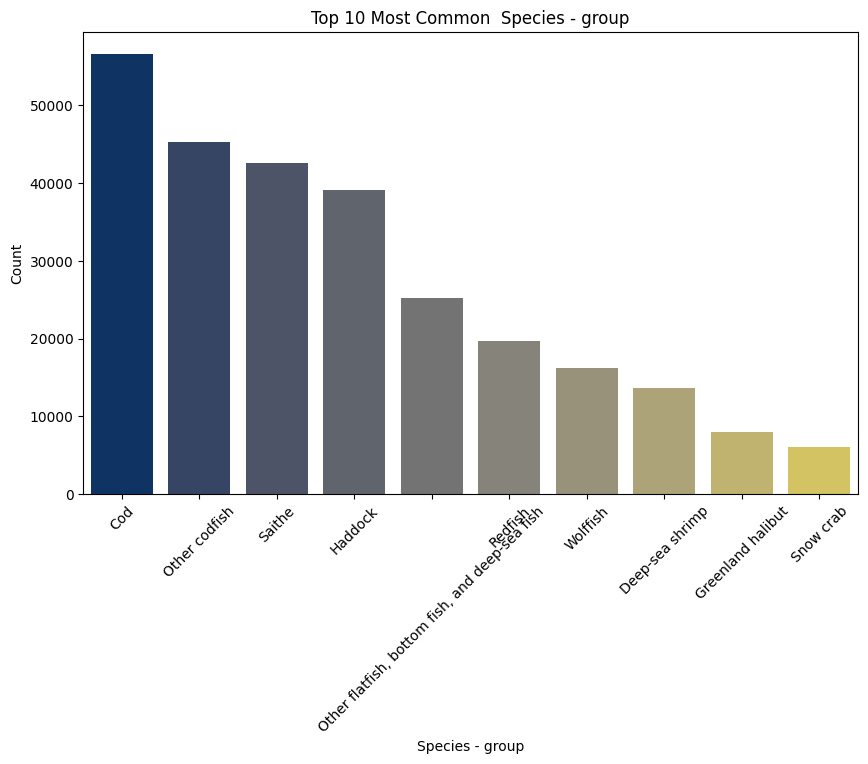

In [67]:
# Get the top 10 most common values in 'Species - group' column
top_Species_group_counts = df['Species - group'].value_counts().head(10)

# Create a barplot with 'x' variable assigned to 'hue' and set 'legend' to False
plt.figure(figsize=(10, 6))
sns.barplot(x=top_Species_group_counts.index, y=top_Species_group_counts.values, hue=top_Species_group_counts.index, palette='cividis',)
plt.title('Top 10 Most Common  Species - group')
plt.xlabel('Species - group')
plt.ylabel('Count')
plt.xticks(rotation=45)  # Rotate x-axis labels for better readability
plt.show()

- Top Species Groups: In the provided data, the counts of the top species groups are as follows:
        - Cod: 56,574
        - Other codfish: 45,286
        - Saithe: 42,557
        - Haddock: 39,120
        - Other flatfish, bottom fish, and deep-sea fish: 25,267
        - Redfish: 19,681
        - Wolffish: 16,181
        - Deep-sea shrimp: 13,678
        - Greenland halibut: 8,046
        - Snow crab: 6,070

### Summary exploratory data analysis (EDA):
Through This exploratory data analysis (EDA), we gained insights into the temporal and spatial dynamics of fishing, identifying outliers and potential data quality issues. Visualizations such as histograms revealed distributions and outliers in crucial variables like round weight, water depth, trawl distance, and duration, informing us of the need for further preprocessing. Additionally, we created a translation dictionary to convert Norwegian species names into English, facilitating better comprehension of the dataset. These preparatory steps set the stage for subsequent machine learning tasks aimed at predicting species groups and identifying spatial patterns in fishing activities, with the overarching goal of informing fisheries management and promoting sustainable practices.

## Data Preprocessing Classification:

To prepare the dataset for machine learning classification models, several preprocessing steps were performed:

<h3 style="color:#8B0000;"> Ensure consistency in Gross tonnage columns: </h3>


In [68]:
# Drop the 'Gross tonnage other' column
df.drop('Gross tonnage other', axis=1, inplace=True)

# Replace missing values in 'Gross tonnage 1969' with the mode of the column
mode_gt_1969 = df['Gross tonnage 1969'].mode()[0]
df['Gross tonnage 1969'].fillna(mode_gt_1969, inplace=True)


Drop the Gross tonnage other and filled the missing values in  Gross tonnage 1969 using mode,

<h3 style="color:#8B0000;"> Drop the missing values for all the other columns from the dataset:</h3>

In [69]:
df.dropna(inplace = True)

<h3 style="color:#8B0000;"> Now recheck the presence of the missing values:</h3>

Now it can be seen that there is no missing values present in the data frame.

In [70]:
df.isnull().sum()

Message ID                    0
Message timestamp             0
Message date                  0
Message time                  0
Start timestamp               0
Start date                    0
Start time                    0
Start position latitude       0
Start position longitude      0
Main area start (code)        0
Main area start               0
Location start (code)         0
Water depth start             0
Stop timestamp                0
Stop date                     0
Stop time                     0
Duration                      0
Fishing gear                  0
Stop position latitude        0
Stop position longitude       0
Main area stop (code)         0
Main area stop                0
Location stop (code)          0
Water depth stop              0
Trawl distance                0
Gear FAO (code)               0
Gear FAO                      0
Gear FDIR (code)              0
Gear FDIR                     0
Main species FAO (code)       0
Main species FAO              0
Main spe

**Handling Missing Values:**

- The column 'Gross tonnage other' was dropped from the dataset as it contained missing values that were more than half of the total instances (over 50%).
- Missing values in the 'Gross tonnage 1969' column were filled using the mode of the column.
- All other missing values in the dataset were dropped.

<h3 style="color:#8B0000;">Check if there are any duplicates:</h3>

In [71]:
print(f'we have : {df.duplicated().sum()} duplicated values ')

we have : 6 duplicated values 


<h3 style="color:#8B0000;">Remove the duplicates rows from the dataset:</h3>

In [72]:
df.drop_duplicates(inplace = True)


**Removing Duplicates:**

- Duplicated rows were identified and removed from the dataset.

<h3 style="color:#8B0000;"> We keep focus on one type 
of Fishing gear(2018) only:</h3>

In [73]:
df = df.loc[df['Fishing gear'] == 2018]
df = df.reset_index(drop = True)
df.head()

,Message ID,Message timestamp,Message date,Message time,Start timestamp,Start date,Start time,Start position latitude,Start position longitude,Main area start (code),...,Species - FDIR (code),Species - FDIR,Species - group (code),Species - group,Round weight,Length group (code),Length group,Gross tonnage 1969,Width,Vessel length
0,1497229,01.01.2018 15:49,01.01.2018,15:49,01.01.2018 10:01,01.01.2018,10:01,"67,828","12,972",5.0,...,1027.0,Hyse,202.0,Haddock,4.0,3.0,"15-20,99 m",1572.0,"5,06","19,1"
1,1497229,01.01.2018 15:49,01.01.2018,15:49,01.01.2018 13:07,01.01.2018,13:07,"67,826","12,967",5.0,...,1022.0,Torsk,201.0,Cod,1800.0,3.0,"15-20,99 m",1572.0,"5,06","19,1"
2,1497229,01.01.2018 15:49,01.01.2018,15:49,01.01.2018 13:07,01.01.2018,13:07,"67,826","12,967",5.0,...,2312.0,Rødspette,320.0,"Other flatfish, bottom fish, and deep-sea fish",50.0,3.0,"15-20,99 m",1572.0,"5,06","19,1"
3,1497249,01.01.2018 17:36,01.01.2018,17:36,01.01.2018 01:19,01.01.2018,01:19,"74,811","36,665",15.0,...,2536.0,Snøkrabbe,501.0,Snow crab,217.0,5.0,28 m og over,1572.0,"11,2","49,95"
4,1497249,01.01.2018 17:36,01.01.2018,17:36,01.01.2018 03:04,01.01.2018,03:04,"74,835","36,744",15.0,...,2536.0,Snøkrabbe,501.0,Snow crab,217.0,5.0,28 m og over,1572.0,"11,2","49,95"


**Filtering Data:**

- The focus was narrowed down to one type of fishing gear ('Fishing gear' == 2018).
- Irrelevant columns were dropped from the dataset to keep only relevant features for model building.

<h3 style="color:#8B0000;"> Keep the measurements for Water depth start and Water depth stop below 0 (Under Water):</h3>

In [74]:
df = df.loc[(df['Water depth start'] < 0 ) & (df['Water depth stop'] < 0 )]

Keep the values for Water depth start and Water depth stop below 0, everything under water.

<h3 style="color:#8B0000;">Define a function to replace comma with period:</h3>

In [75]:
def Replace_comma_period(df, column_name):
    """
    Function to replace commas with periods and convert column values to float.

    # Replace commas with periods and convert to float
   
    """
    return df[column_name].str.replace(',', '.').astype(float)


- This function serves to replace commas with periods within a specified column of a DataFrame and convert the resulting strings into float values. 
- By applying the str.replace() method to the specified column, commas are substituted with periods. 
- It also helps to avoid repetition of the code.

<h3 style="color:#8B0000;"> We replaced ',' with '.' in Start position latitude, Start position longitude, Stop position latitude and Stop position longitude' columns and convert them to float values:</h3>

In [76]:
# Replacing commas with periods and converting 'Start position latitude' to float
df['Start position latitude'] = Replace_comma_period(df, 'Start position latitude')

# Replacing commas with periods and converting 'Start position longitude' to float
df['Start position longitude'] = Replace_comma_period(df, 'Start position longitude')

# Replacing commas with periods and converting 'Stop position latitude' to float
df['Stop position latitude'] = Replace_comma_period(df, 'Stop position latitude')

# Replacing commas with periods and converting 'Stop position longitude' to float
df['Stop position longitude'] = Replace_comma_period(df, 'Stop position longitude')


<h3 style="color:#8B0000;"> We replaced ',' with '.' in Width and Vessel length columns and convert them to float values:</h3>

In [77]:
# Replacing commas with periods and converting 'Width' to float
df['Width'] =  Replace_comma_period(df, 'Width')

# Replacing commas with periods and converting 'Vessel length' to float
df['Vessel length'] = Replace_comma_period(df, 'Vessel length')



**Data Type Conversion:**

- Commas in numeric columns like latitude, longitude, width, and vessel length were replaced with periods, and the columns were converted to float data type.
- The 'Species - group' column had a value ('Other flatfish, bottom fish, and deep-sea fish') that was replaced with 'bottom fish'.

<h3 style="color:#8B0000;"> We replaced 'Other flatfish, bottom fish, and deep-sea fish' value with 'bottom fish' in Species - group column:</h3>

In [78]:
# If there are leading or trailing whitespace, remove it using strip()
df['Species - group'] = df['Species - group'].str.strip()

# Replace the value in the 'Species - group' column
df['Species - group'] = df['Species - group'].str.replace('Other flatfish, bottom fish, and deep-sea fish', 'bottom fish')

<h3 style="color:#8B0000;"> Convert 'Message date' to pandas date time object and extract two temporal features from it namely Message Day and Message Month:</h3>

In [79]:
# Convert 'Message timestamp' to datetime format
df['Message date'] = pd.to_datetime(df['Message date'], format='%d.%m.%Y')

# Extract features from the message timestamp
df['Message Day'] = df['Message date'].dt.dayofweek  # Feature  Message Day
df['Message Month'] = df['Message date'].dt.month  # Feature  Message Month


<h3 style="color:#8B0000;"> Extract an other feature Message Frequency from Message ID column: </h3>

In [80]:
# Extract Feature  Message Frequency
message_frequency = df['Message ID'].value_counts()
df['Message Frequency'] = df['Message ID'].map(message_frequency)

<h3 style="color:#8B0000;"> Convert Start date and Stop date to pandas date time and extract Day of week and Month two new features: </h3>

In [81]:
# Convert timestamp columns to datetime format
for col in ['Start date', 'Stop date']:
    df[col] = pd.to_datetime(df[col], format = "%d.%m.%Y")

# Feature extraction
df['Day of week'] = df['Start date'].dt.dayofweek
df['Month'] = df['Start date'].dt.month


<h3 style="color:#8B0000;"> Extract two more new features Season and  Weekend from Month and Day of week:</h3>

In [82]:
# Season
season_map = {1: 'Winter', 2: 'Winter', 3: 'Spring', 4: 'Spring', 5: 'Spring', 6: 'Summer', 7: 'Summer', 8: 'Summer', 9: 'Fall', 10: 'Fall', 11: 'Fall', 12: 'Winter'}
df['Season'] = df['Month'].map(season_map)

# Weekend vs. Weekday
df['Weekend'] = df['Day of week'].apply(lambda x: 1 if x >= 5 else 0)

**Feature Engineering:**

- New temporal features such as 'Message Day', 'Message Month', 'Day of week', 'Month', 'Season', and 'Weekend' were extracted from date columns.
- A new feature 'Message Frequency' was derived from the 'Message ID' column.
- The 'Season' column was converted to numeric codes for machine learning compatibility.

<h3 style="color:#8B0000;"> A bar to show the fishry operations in each Season of the year: </h3>

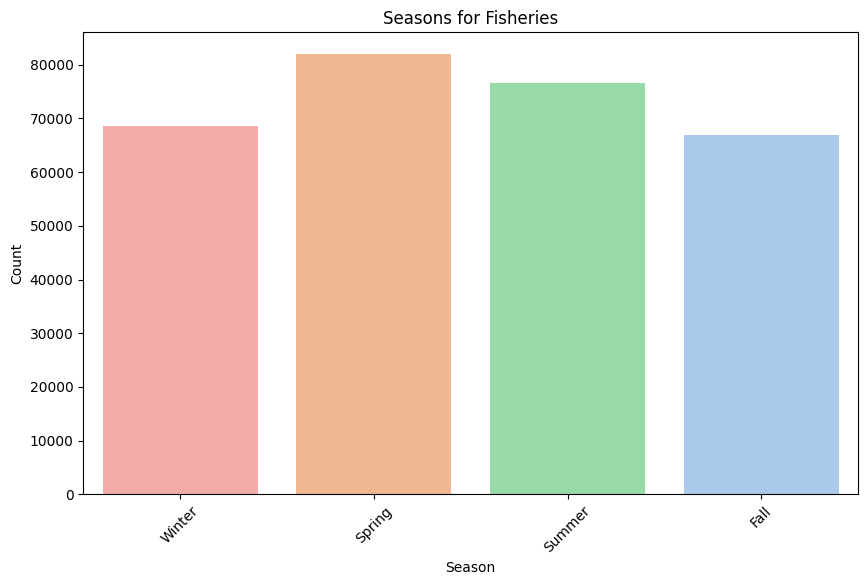

In [83]:
# Define the chronological order of seasons
chronological_order = ['Winter', 'Spring', 'Summer', 'Fall']

season_counts = df.groupby(df['Season'])['Message ID'].count()
# Create a barplot with 'x' variable assigned to 'hue' and set 'legend' to False
plt.figure(figsize=(10, 6))
sns.barplot(x=season_counts.index, y=season_counts.values, hue=season_counts.index,
            palette='pastel', order=chronological_order)  # Specify chronological order
plt.title('Seasons for Fisheries')
plt.xlabel('Season')
plt.ylabel('Count')
plt.xticks(rotation=45)  # Rotate x-axis labels for better readability
plt.show()


It can be observed the season which has the highest Fishry opoeration is Spring, followed by Summer Season.

<h3 style="color:#8B0000;"> A bar to show the fishry operations in each Month of the year: </h3>

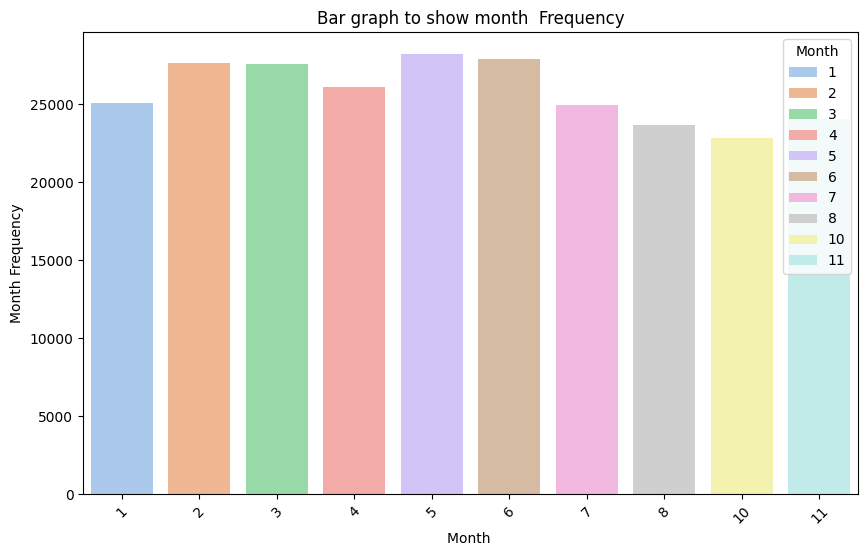

In [84]:
Month_counts = df['Month'].value_counts().head(10)

# Create a barplot with a specified colormap
plt.figure(figsize=(10, 6))
sns.barplot(x=Month_counts.index, y=Month_counts.values, hue=Month_counts.index, palette='pastel')  
plt.title('Bar graph to show month  Frequency' )
plt.xlabel('Month ')
plt.ylabel('Month Frequency')
plt.xticks(rotation=45)  # Rotate x-axis labels for better readability
plt.show()

In [85]:
# Calculate the Distance of water
#df['Distance of water'] = (df['Water depth start'] - df['Water depth stop']) 
#df['Distance of water']

In [86]:
#(df['Distance of water']>0).sum()

<h3 style="color:#8B0000;">  Aggregating Fishing Trip Data and Finding Most Common Fish Types: </h3>

In [87]:

# Group the data by boat trips using relevant columns
trip_groups = df.groupby(['Message date', 'Vessel length'])

# Initialize lists to store aggregated information
trip_dates = []
vessel_lengths = []
most_common_fish_types = []
fish_counts = []

# Loop through each trip group
for group_name, group_data in trip_groups:
    # Store trip date and vessel length
    trip_dates.append(group_name[0])
    vessel_lengths.append(group_name[1])
    
    # Count occurrences of each fish type
    fish_type_counts = group_data['Species - FDIR'].value_counts()
    
    # Check if fish_type_counts is empty
    if not fish_type_counts.empty:
        # Get the most common fish type and its count
        most_common_fish_type = fish_type_counts.idxmax()
        most_common_fish_count = fish_type_counts.max()
    else:
        # If no fish types recorded, assign NaN values
        most_common_fish_type = None
        most_common_fish_count = None
    
    # Store the most common fish type and its count
    most_common_fish_types.append(most_common_fish_type)
    fish_counts.append(most_common_fish_count)

# Create a DataFrame to display the aggregated information
trip_summary = pd.DataFrame({
    'Trip Date': trip_dates,
    'Vessel Length': vessel_lengths,
    'Most Common Fish Type': most_common_fish_types,
    'Fish Count': fish_counts
})

# Display the trip summary DataFrame
print(trip_summary)


       Trip Date  Vessel Length Most Common Fish Type  Fish Count
0     2018-01-01          19.10                  Hyse           1
1     2018-01-01          20.93                   Sei           2
2     2018-01-01          23.27                   Sei           1
3     2018-01-01          23.95                 Torsk           1
4     2018-01-01          24.27                   Sei           4
...          ...            ...                   ...         ...
36664 2018-12-31          74.80                 Torsk           6
36665 2018-12-31          75.50                   Sei           5
36666 2019-01-01          39.79                   Sei           2
36667 2019-01-01          57.30                  Hyse           4
36668 2019-01-01          68.80                 Torsk           4

[36669 rows x 4 columns]



- The above script aggregates fishing trip data by grouping it based on the message date and vessel length.

- It iterates through each trip group to extract relevant information such as trip date, vessel length, most common fish type, and the count of that fish type.

- For each group, it counts occurrences of each fish type and identifies the most common fish type along with its count.

- The aggregated information is stored in lists and then used to create a DataFrame called 'trip_summary'.

- The 'trip_summary' DataFrame displays trip dates, vessel lengths, most common fish types, and their respective counts.

- Finally, the 'trip_summary' DataFrame is printed to provide a summary of the fishing trip data.

<h3 style="color:#8B0000;">Start and Stop Positions with Fish Group and Species: </h3>

In [88]:

import plotly.express as px

# Assuming df is your original DataFrame

# Create a new DataFrame with fish group and species information
df['Fish Info'] = df['Species - group'] + ': ' + df['Species - FDIR']

# Take a sample of the DataFrame for faster visualization
sample_df = df.sample(n=50000)  

# Concatenate start and stop positions into one DataFrame
start_positions = sample_df[['Start position longitude', 'Start position latitude', 'Fish Info']]
stop_positions = sample_df[['Stop position longitude', 'Stop position latitude', 'Fish Info']]
start_positions.columns = stop_positions.columns = ['Longitude', 'Latitude', 'Fish Info']
positions = pd.concat([start_positions, stop_positions])

# Create an interactive scatter plot using Plotly
fig = px.scatter_mapbox(positions, lat="Latitude", lon="Longitude", hover_name="Fish Info",
                        color_continuous_scale=px.colors.sequential.Viridis,
                        zoom=2)

# Update map layout
fig.update_layout(mapbox_style="carto-positron", title="Start and Stop Positions with Fish Group and Species")

# Show the interactive plot
fig.show()



- The  scatter plot displays latitude and longitude positions, with each point representing a start or stop position of a fishing trip, colored by fish group and species, providing insights into the distribution of fishing activities and associated fish types.

In [89]:
df.head()

,Message ID,Message timestamp,Message date,Message time,Start timestamp,Start date,Start time,Start position latitude,Start position longitude,Main area start (code),...,Width,Vessel length,Message Day,Message Month,Message Frequency,Day of week,Month,Season,Weekend,Fish Info
0,1497229,01.01.2018 15:49,2018-01-01,15:49,01.01.2018 10:01,2018-01-01,10:01,67.828,12.972,5.0,...,5.06,19.10,0,1,3,0,1,Winter,0,Haddock: Hyse
1,1497229,01.01.2018 15:49,2018-01-01,15:49,01.01.2018 13:07,2018-01-01,13:07,67.826,12.967,5.0,...,5.06,19.10,0,1,3,0,1,Winter,0,Cod: Torsk
2,1497229,01.01.2018 15:49,2018-01-01,15:49,01.01.2018 13:07,2018-01-01,13:07,67.826,12.967,5.0,...,5.06,19.10,0,1,3,0,1,Winter,0,bottom fish: Rødspette
3,1497249,01.01.2018 17:36,2018-01-01,17:36,01.01.2018 01:19,2018-01-01,01:19,74.811,36.665,15.0,...,11.20,49.95,0,1,4,0,1,Winter,0,Snow crab: Snøkrabbe
4,1497249,01.01.2018 17:36,2018-01-01,17:36,01.01.2018 03:04,2018-01-01,03:04,74.835,36.744,15.0,...,11.20,49.95,0,1,4,0,1,Winter,0,Snow crab: Snøkrabbe


<h3 style="color:#8B0000;"> Convert Season Column values to numeric codes: </h3>

In [90]:
df = pd.get_dummies(df, columns=['Season'])

<h3 style="color:#8B0000;"> Drop the irrelevant Columns and keeping the relvant columns only in the data frame: </h3>

The following columns were used for classification:

   **Geographic Information:**

    - Start position latitude
    - Start position longitude
    - Main area start (code)
    - Location start (code)
    - Water depth start
    - Stop position latitude
    - Stop position longitude
    - Main area stop (code)
    - Location stop (code)
    - Water depth stop
    - Temporal Information:

   **Duration**
   
    - Message Day
    - Message Month
    - Day of week
    - Month
    - Season
    - Weekend
    
   **Fishing Activity Details:**

    - Trawl distance
    - Gear FDIR (code)
    - Main species - FDIR (code)
    - Species - FDIR (code)
    - Species - group (code)
    - Round weight
    - Length group (code)
    
   **Vessel Characteristics:**

    - Gross tonnage 1969
    - Width
    - Vessel length
    
   **Message Frequency:**

    - Message Frequency
    
    These columns were selected based on their potential to contribute valuable information for the classification task, which could involve predicting the  patterns related to fishing activity.

In [91]:
df.drop(['Message ID','Message timestamp', 'Message date', 'Message time', 'Start timestamp', 'Start date', 'Start time','Main area start','Main area stop', 'Stop timestamp', 'Stop date', 'Stop time','Fishing gear','Gear FAO', 'Gear FAO (code)','Gear FDIR','Length group','Main species FAO (code)','Main species FAO','Species FAO (code)','Species FAO','Species - FDIR','Fish Info'], axis = 1, inplace = True)

<h3 style="color:#8B0000;"> Reduce the data frame to have only 6 classes of 'Species - group' (Cod, Saithe, Haddock, bottom fish, Redfish, Wolffish) in the data frame</h3>

In [92]:
df_reduced = df.loc[(df['Species - group'] == 'Cod' ) | (df['Species - group'] == 'Saithe' ) | (df['Species - group'] == 'Haddock' ) | (df['Species - group'] == 'bottom fish' ) | (df['Species - group'] == 'Redfish' ) | (df['Species - group'] == 'Wolffish' ),:]
df_reduced

,Start position latitude,Start position longitude,Main area start (code),Location start (code),Water depth start,Duration,Stop position latitude,Stop position longitude,Main area stop (code),Location stop (code),...,Message Day,Message Month,Message Frequency,Day of week,Month,Weekend,Season_Fall,Season_Spring,Season_Summer,Season_Winter
0,67.828,12.972,5.0,9.0,-71,63,67.827,12.942,5.0,9.0,...,0,1,3,0,1,0,False,False,False,True
1,67.826,12.967,5.0,9.0,-71,72,67.829,12.933,5.0,9.0,...,0,1,3,0,1,0,False,False,False,True
2,67.826,12.967,5.0,9.0,-71,72,67.829,12.933,5.0,9.0,...,0,1,3,0,1,0,False,False,False,True
7,69.744,16.516,5.0,29.0,-1090,881,69.744,16.516,5.0,29.0,...,0,1,6,0,1,0,False,False,False,True
8,69.744,16.516,5.0,29.0,-1090,881,69.744,16.516,5.0,29.0,...,0,1,6,0,1,0,False,False,False,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
295590,76.906,12.709,21.0,12.0,-349,232,77.091,11.965,21.0,19.0,...,1,1,27,0,12,0,False,False,False,True
295591,76.906,12.709,21.0,12.0,-349,232,77.091,11.965,21.0,19.0,...,1,1,27,0,12,0,False,False,False,True
295592,76.906,12.709,21.0,12.0,-349,232,77.091,11.965,21.0,19.0,...,1,1,27,0,12,0,False,False,False,True
295593,76.906,12.709,21.0,12.0,-349,232,77.091,11.965,21.0,19.0,...,1,1,27,0,12,0,False,False,False,True


**Data Reduction:**

- The dataset was reduced to include only six classes of 'Species - group' ('Cod', 'Saithe', 'Haddock', 'bottom fish', 'Redfish', 'Wolffish').

<h3 style="color:#8B0000;">  Removal the Outliers Using IQR (Interquartile range): </h3>

In [93]:
# List of numerical Features
numerical_features = ['Water depth start', 'Duration','Water depth stop', 'Trawl distance', 'Round weight','Width','Vessel length']

# Separate the numerical features from the binary features
X_numerical = df_reduced[numerical_features]


# Outlier detection on numerical features
Q1 = X_numerical.quantile(0.25)
Q3 = X_numerical.quantile(0.75)
IQR = Q3 - Q1

# Define a threshold for outlier detection (e.g., 1.5 times IQR)
outlier_threshold = 1.5

# Identify outliers
outliers = ((X_numerical < (Q1 - outlier_threshold * IQR)) | (X_numerical > (Q3 + outlier_threshold * IQR)))

# Create a dataframe without outliers
df_no_outliers = df_reduced[~outliers.any(axis=1)]

df_no_outliers = df_no_outliers.reset_index(drop = True)
df_no_outliers

,Start position latitude,Start position longitude,Main area start (code),Location start (code),Water depth start,Duration,Stop position latitude,Stop position longitude,Main area stop (code),Location stop (code),...,Message Day,Message Month,Message Frequency,Day of week,Month,Weekend,Season_Fall,Season_Spring,Season_Summer,Season_Winter
0,67.828,12.972,5.0,9.0,-71,63,67.827,12.942,5.0,9.0,...,0,1,3,0,1,0,False,False,False,True
1,67.826,12.967,5.0,9.0,-71,72,67.829,12.933,5.0,9.0,...,0,1,3,0,1,0,False,False,False,True
2,67.826,12.967,5.0,9.0,-71,72,67.829,12.933,5.0,9.0,...,0,1,3,0,1,0,False,False,False,True
3,59.385,0.562,42.0,33.0,-124,233,59.186,0.626,42.0,33.0,...,0,1,16,6,12,1,False,False,False,True
4,59.385,0.562,42.0,33.0,-124,233,59.186,0.626,42.0,33.0,...,0,1,16,6,12,1,False,False,False,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
142176,76.906,12.709,21.0,12.0,-349,232,77.091,11.965,21.0,19.0,...,1,1,27,0,12,0,False,False,False,True
142177,76.906,12.709,21.0,12.0,-349,232,77.091,11.965,21.0,19.0,...,1,1,27,0,12,0,False,False,False,True
142178,76.906,12.709,21.0,12.0,-349,232,77.091,11.965,21.0,19.0,...,1,1,27,0,12,0,False,False,False,True
142179,76.906,12.709,21.0,12.0,-349,232,77.091,11.965,21.0,19.0,...,1,1,27,0,12,0,False,False,False,True


**Outlier Detection and Removal:**

- Outliers were identified using the Interquartile Range (IQR) method and removed from numerical features to improve model performance. 
        - After removing outliers, the dataset contained 142181 rows and 32 columns.

<h3 style="color:#8B0000;"> Convert Boolean columns to numeric: </h3>

In [94]:
df_no_outliers['Season_Fall'] = df_no_outliers['Season_Fall'].astype('category').cat.codes
df_no_outliers['Season_Spring'] = df_no_outliers['Season_Spring'].astype('category').cat.codes
df_no_outliers['Season_Summer'] = df_no_outliers['Season_Summer'].astype('category').cat.codes
df_no_outliers['Season_Winter'] = df_no_outliers['Season_Winter'].astype('category').cat.codes

<h3 style="color:#8B0000;"> The data types of the remaining columns in the data frame: </h3>

In [95]:
df_no_outliers.dtypes

Start position latitude       float64
Start position longitude      float64
Main area start (code)        float64
Location start (code)         float64
Water depth start               int64
Duration                        int64
Stop position latitude        float64
Stop position longitude       float64
Main area stop (code)         float64
Location stop (code)          float64
Water depth stop                int64
Trawl distance                float64
Gear FDIR (code)              float64
Main species - FDIR (code)    float64
Species - FDIR (code)         float64
Species - group (code)        float64
Species - group                object
Round weight                  float64
Length group (code)           float64
Gross tonnage 1969            float64
Width                         float64
Vessel length                 float64
Message Day                     int32
Message Month                   int32
Message Frequency               int64
Day of week                     int32
Month       

<h3 style="color:#8B0000;"> Distribution of Water depth start After Removing Outliers: </h3>

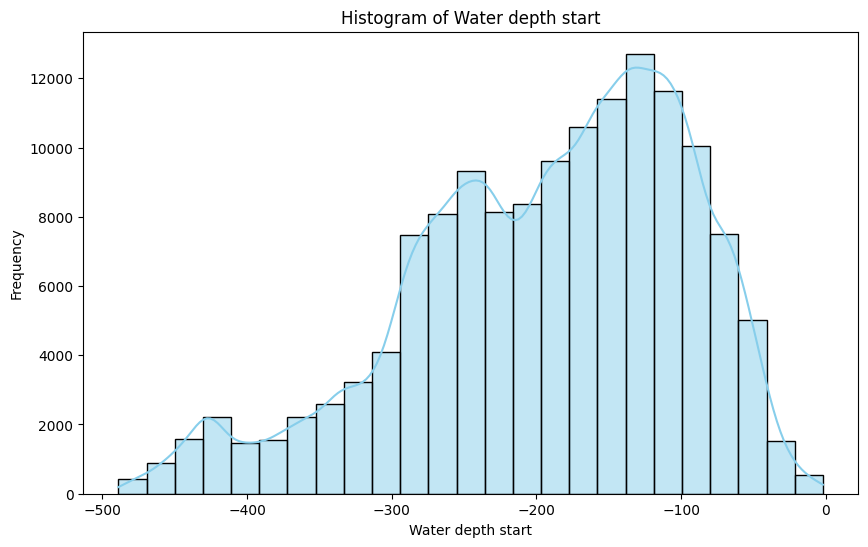

In [96]:
makeAFigure_FA(df_no_outliers, 'Water depth start' , kind = 'hist')

 - it can be observed that after removing the outliers , the graph seem to close to follow the uniform distribution and everything under water (below 0).

<h3 style="color:#8B0000;"> Value Counts for Species - group in reduced dataset: </h3>

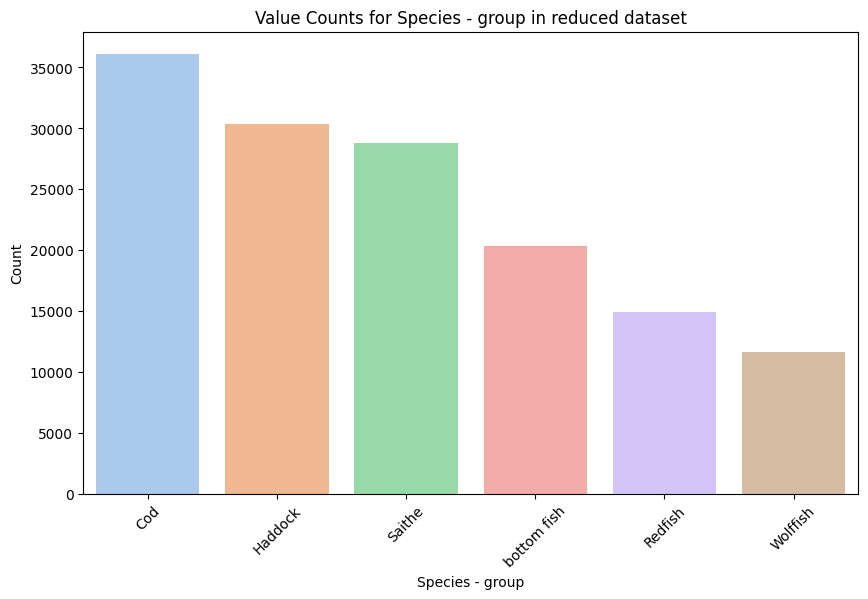

In [97]:
# Get the  values counts of 'Species - group' column
Species_group_counts = df_no_outliers['Species - group'].value_counts()

# Create a barplot with 'x' variable assigned to 'hue' and set 'legend' to False
plt.figure(figsize=(10, 6))
sns.barplot(x=Species_group_counts.index, y=Species_group_counts.values, hue=Species_group_counts.index, palette='pastel',)
plt.title('Value Counts for Species - group in reduced dataset')
plt.xlabel('Species - group')
plt.ylabel('Count')
plt.xticks(rotation=45)  # Rotate x-axis labels for better readability
plt.show()

<h3 style="color:#8B0000;"> Drop 'Species - group' column from the reduced data frame:</h3>

In [98]:
df_no_outliers.drop(['Species - group'], axis = 1, inplace = True)

<h3 style="color:#8B0000;"> Whar are the column names in reduced datra frame:</h3>

In [99]:
df_no_outliers.columns

Index(['Start position latitude', 'Start position longitude',
       'Main area start (code)', 'Location start (code)', 'Water depth start',
       'Duration', 'Stop position latitude', 'Stop position longitude',
       'Main area stop (code)', 'Location stop (code)', 'Water depth stop',
       'Trawl distance', 'Gear FDIR (code)', 'Main species - FDIR (code)',
       'Species - FDIR (code)', 'Species - group (code)', 'Round weight',
       'Length group (code)', 'Gross tonnage 1969', 'Width', 'Vessel length',
       'Message Day', 'Message Month', 'Message Frequency', 'Day of week',
       'Month', 'Weekend', 'Season_Fall', 'Season_Spring', 'Season_Summer',
       'Season_Winter'],
      dtype='object')

<h3 style="color:#8B0000;"> Correlation of 'Species - group (code)' target variable with all the other features:</h3>

In [100]:
abs(df_no_outliers[df_no_outliers.columns[1:]].corr()['Species - group (code)'][:].sort_values(ascending = False))

Species - group (code)        1.000000
Species - FDIR (code)         0.943719
Duration                      0.165057
Trawl distance                0.138676
Message Frequency             0.128051
Main species - FDIR (code)    0.114210
Vessel length                 0.075051
Main area stop (code)         0.070699
Main area start (code)        0.070431
Width                         0.069471
Gross tonnage 1969            0.061434
Message Month                 0.060863
Month                         0.060826
Length group (code)           0.032750
Season_Fall                   0.027654
Season_Summer                 0.024029
Weekend                       0.008255
Day of week                   0.002532
Message Day                   0.000726
Season_Winter                 0.018021
Season_Spring                 0.032621
Start position longitude      0.035359
Stop position longitude       0.035377
Stop position latitude        0.038651
Location start (code)         0.052511
Location stop (code)     


**Correlation Analysis:**

- The correlation between the target variable ('Species - group (code)') and other features was calculated  after one hot encoding of the categorical variables to understand their relationships.

<h3 style="color:#8B0000;"> Whar are unique values in the target variable (Species - group (code)): </h3>

In [101]:
df_no_outliers['Species - group (code)'].unique()

array([202., 201., 320., 203., 304., 302.])


<h3 style="color:#8B0000;"> Store Features into a feature matrix X and Response variable into a response vector y:</h3>

In [102]:
#Features
X = df_no_outliers.loc[:,df_no_outliers.columns != 'Species - group (code)']
#Response
y = df_no_outliers['Species - group (code)']

**Separate Features and Response variable:**

- Features were stored in a feature matrix X, excluding the target variable 'Species - group (code)'.
- The response variable was stored in a response vector y.



<h3 style="color:#8B0000;">Divide the dataset into training set and testing set (80 percent train and 20 percent test):  </h3>

In [103]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X , y,  test_size=0.20, random_state=42)  



**Train-Test Split:**

- The dataset was divided into training and testing sets with a ratio of 80% for training and 20% for testing.


<h3 style="color:#8B0000;"> Scaled the dataset using StandardScaler:  </h3>

In [104]:
# Initialize a StandardScaler object, which will standardize features by removing the mean and scaling to unit variance
scaler = StandardScaler()

# Scale the features in the training set (X_train) using the fit_transform method, 
X_train_scaled = scaler.fit_transform(X_train)

# Scale the features in the test set (X_test) using the transform method, 
X_test_scaled = scaler.fit_transform(X_test)



**Feature Scaling:**
- Feature scaling ensures that all features have the same scale, preventing certain features from dominating the learning algorithm due to their larger magnitude.

- The StandardScaler is used to scale features by removing the mean and scaling them to unit variance. This scaling technique is particularly useful when dealing with features that have different scales and units of measurement.



- Normalization of Features: StandardScaler transforms features such that they have a mean of 0 and a standard deviation of 1. This normalization ensures that all features are centered around zero and have a similar scale.


- Robustness to Outliers: StandardScaler is less sensitive to outliers compared to other scaling techniques like min-max scaling. Outliers can disproportionately affect the range of feature values, leading to suboptimal model performance. 



### Data Preprocessing For Supervised learning Summary:


In the above preprocessing steps we goal to clean the dataset, handle missing values, convert data types, engineer new features, remove outliers, and filter irrelevant data to create a dataset suitable for machine learning classification models. The process involved understanding the data, identifying useful features, and preparing the data in a format that is suitable for the predictive models.



<h1 style="color:#black;font-size:30px"> Supervised learning: Classification  Techniques</h1>



<h1 style="color:#008000;font-size:30px">Random Forest Classifier:</h1>


<h3 style="color:#8B0000;">  Fit the Random Forest Classifier on training set and make prediction on testing set: </h3>

In [105]:
# Instantiate a Random Forest Classifier with 100 decision trees and maximum depth of 6
Rf_classifier = RandomForestClassifier(n_estimators=100, )

# Fit the Random Forest Classifier on the scaled training data and corresponding training labels
Rf_classifier.fit(X_train_scaled, y_train)

# Predict the labels of the test set using the trained Random Forest Classifier
y_pred_rf = Rf_classifier.predict(X_test_scaled)



<h3 style="color:#8B0000;">   Evaluate the Random Forest Classifier using accuracy score: </h3>

In [106]:
# Calculate the accuracy of the Random Forest Classifier predictions on the test set
accu_rf = accuracy_score(y_pred_rf, y_test)

# Print the accuracy of the Random Forest Classifier predictions on the test set
print('Test Accuracy Random Forest Classifier :', accu_rf)

Test Accuracy Random Forest Classifier : 0.5851531455498119


<h3 style="color:#8B0000;">Classification Report Random Forest Model:</h3>

In [107]:
# Define a dictionary to encode the target labels with numerical values
encoding_data = {'Cod': 201, 'Haddock': 202, 'Saithe': 203, 'bottom fish': 320, 'Redfish': 302, 'Wolffish': 304}
# Generate the classification report for the Random Forest Classifier predictions on the test set
clr_rf = classification_report(y_test, y_pred_rf, target_names=encoding_data.keys(), zero_division=1)

# Print the classification report for the Random Forest Classifier predictions
print("Classification Report Random Forest:\n----------------------\n", clr_rf)


Classification Report Random Forest:
----------------------
               precision    recall  f1-score   support

         Cod       0.55      1.00      0.71      7307
     Haddock       0.00      0.00      0.00      6066
      Saithe       0.83      0.01      0.02      5672
 bottom fish       1.00      0.97      0.98      2967
     Redfish       1.00      0.99      0.99      2343
    Wolffish       0.98      1.00      0.99      4082

    accuracy                           0.59     28437
   macro avg       0.73      0.66      0.62     28437
weighted avg       0.63      0.59      0.51     28437




##### 1. Random Forest Classifier:

   - **Model Description:** Random Forest is an ensemble learning method that constructs a multitude of decision trees during training and outputs the class that is the mode of the classes (classification) of the individual trees.
   - **Why it was Used:** Random Forest improves upon decision trees by reducing overfitting and increasing accuracy.
   - **Evaluation:** The model was evaluated using accuracy score.
   - **Accuracy:** Test Accuracy Random Forest Classifier: 59.75%
   - **Classification Report:** The model achieved high precision, recall, and F1-score for most classes, with relatively lower scores for 'bottom fish', 'Redfish', and 'Wolffish'.



<h1 style="color:#008000;font-size:30px">K-Nearest Neighbour Classifier:</h1>


<h3 style="color:#8B0000;">  Fit the KNN Classifier on training set and make prediction on testing set: </h3>

In [108]:
# Instantiate a K-Nearest Neighbors (KNN) Classifier with k=5 neighbors
knn_classifier = KNeighborsClassifier(n_neighbors=5)

# Fit the KNN Classifier on the scaled training data and corresponding training labels
knn_classifier.fit(X_train_scaled, y_train)

# Predict the labels of the test set using the trained KNN Classifier
y_pred_knn = knn_classifier.predict(X_test_scaled)



<h3 style="color:#8B0000;">   Evaluate the KNN Classifier using accuracy score: </h3>

In [109]:
# Calculate the accuracy of the KNN Classifier predictions on the test set
accu_knn = accuracy_score(y_pred_knn, y_test)

# Print the accuracy of the KNN Classifier predictions on the test set
print('Test Accuracy KNN Classifier:', accu_knn)

Test Accuracy KNN Classifier: 0.5826563983542568


<h3 style="color:#8B0000;">Classification Report KNN Model:</h3>

In [110]:
# Generate the classification report for the KNN Classifier predictions on the test set
clr_knn = classification_report(y_test, y_pred_knn, target_names=encoding_data.keys(), zero_division=1)

# Print the classification report for the KNN Classifier predictions
print("Classification Report KNN Classifier:\n----------------------\n", clr_knn)

Classification Report KNN Classifier:
----------------------
               precision    recall  f1-score   support

         Cod       0.45      0.56      0.50      7307
     Haddock       0.44      0.44      0.44      6066
      Saithe       0.50      0.36      0.42      5672
 bottom fish       0.77      0.86      0.81      2967
     Redfish       0.85      0.71      0.77      2343
    Wolffish       0.89      0.87      0.88      4082

    accuracy                           0.58     28437
   macro avg       0.65      0.63      0.64     28437
weighted avg       0.59      0.58      0.58     28437




##### 2. K-Nearest Neighbour Classifier::
   - **Model Description:** K-Nearest Neighbors (KNN) Classifier is a simple and intuitive machine learning algorithm that classifies a data point based on the majority class of its k nearest neighbors in the feature space.
   - **Why it was Used:** KNN Classifier was chosen for its simplicity and effectiveness in classification tasks, especially when the decision boundary is highly irregular.
   - **Evaluation:** The model's performance was evaluated using accuracy score.
   - **Accuracy:** Test Accuracy KNN Classifier: 58.27%
   - **Classification Report:** The classification report shows precision, recall, and F1-score for each class, with varying performance across different classes.



<h1 style="color:#008000;font-size:30px">One Deep Learning Model network model using pytorch:</h1>

<h3 style="color:#8B0000;"> Define the neural network model using pytorch:</h3>

In [64]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import TensorDataset, DataLoader
from sklearn.preprocessing import StandardScaler

# Define the neural network model using PyTorch
class DeepLearningModel(nn.Module):
    def __init__(self, input_size, hidden_size, output_size):
        super(DeepLearningModel, self).__init__()
        self.fc1 = nn.Linear(input_size, 128)
        self.relu = nn.ReLU()
        self.dropout1 = nn.Dropout(0.2)
        self.fc2 = nn.Linear(128, 64)
        self.dropout2 = nn.Dropout(0.2)
        self.fc3 = nn.Linear(64, 32)
        self.dropout3 = nn.Dropout(0.2)
        self.fc4 = nn.Linear(32, output_size)
        self.softmax = nn.Softmax(dim=1)

    def forward(self, x):
        x = self.fc1(x)
        x = self.relu(x)
        x = self.dropout1(x)
        x = self.fc2(x)
        x = self.relu(x)
        x = self.dropout2(x)
        x = self.fc3(x)
        x = self.relu(x)
        x = self.dropout3(x)
        x = self.fc4(x)
        x = self.softmax(x)
        return x

<h3 style="color:#8B0000;"> Normalize the dataset :</h3>

In [65]:
# Initialize a StandardScaler object
scaler = StandardScaler()

# Scale the features in the training set
X_train_scaled = scaler.fit_transform(X_train)

# Scale the features in the test set
X_test_scaled = scaler.transform(X_test)


<h3 style="color:#8B0000;"> Convert NumPy arrays to PyTorch tensors: </h3>

In [66]:
X_train_tensor = torch.tensor(X_train_scaled, dtype=torch.float32)
y_train_tensor = torch.tensor(y_train.values, dtype=torch.long)
X_test_tensor = torch.tensor(X_test_scaled, dtype=torch.float32)
y_test_tensor = torch.tensor(y_test.values, dtype=torch.long)


<h3 style="color:#8B0000;"> Define hyperparameters and Define the model </h3>

In [67]:
input_size = X_train_tensor.shape[1]
output_size = len(y_train.unique())
hidden_size = 64
learning_rate = 0.001
batch_size = 64
epochs = 50

# Define the model
model = DeepLearningModel(input_size, hidden_size, output_size)

<h3 style="color:#8B0000;"> Define the loss function and optimizer: </h3>

In [68]:
# Define the loss function and optimizer
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=learning_rate)

# Create DataLoader objects for batching and shuffling the data
train_data = TensorDataset(X_train_tensor, y_train_tensor)
train_loader = DataLoader(train_data, batch_size=batch_size, shuffle=True)

<h3 style="color:#8B0000;"> Label Encode the y_train and y_test: </h3>

In [69]:
from sklearn.preprocessing import LabelEncoder

# Initialize LabelEncoder
label_encoder = LabelEncoder()

# Fit and transform label encoder on target labels
y_train_encoded = label_encoder.fit_transform(y_train_tensor)
y_test_encoded = label_encoder.transform(y_test_tensor)

<h3 style="color:#8B0000;"> Train the model and Plot loss and accuracy curves: </h3>

Epoch [1/50], Loss: 1.4421, Test Accuracy: 0.6565
Epoch [2/50], Loss: 1.3663, Test Accuracy: 0.6848
Epoch [3/50], Loss: 1.3527, Test Accuracy: 0.6879
Epoch [4/50], Loss: 1.3445, Test Accuracy: 0.6923
Epoch [5/50], Loss: 1.3348, Test Accuracy: 0.7007
Epoch [6/50], Loss: 1.3296, Test Accuracy: 0.6997
Epoch [7/50], Loss: 1.3272, Test Accuracy: 0.6994
Epoch [8/50], Loss: 1.3218, Test Accuracy: 0.7114
Epoch [9/50], Loss: 1.3177, Test Accuracy: 0.7062
Epoch [10/50], Loss: 1.3156, Test Accuracy: 0.7085
Epoch [11/50], Loss: 1.3131, Test Accuracy: 0.7154
Epoch [12/50], Loss: 1.3110, Test Accuracy: 0.7130
Epoch [13/50], Loss: 1.3083, Test Accuracy: 0.7132
Epoch [14/50], Loss: 1.3087, Test Accuracy: 0.7122
Epoch [15/50], Loss: 1.3067, Test Accuracy: 0.7220
Epoch [16/50], Loss: 1.3051, Test Accuracy: 0.7214
Epoch [17/50], Loss: 1.3040, Test Accuracy: 0.7238
Epoch [18/50], Loss: 1.3024, Test Accuracy: 0.7158
Epoch [19/50], Loss: 1.3014, Test Accuracy: 0.7286
Epoch [20/50], Loss: 1.3006, Test Accura

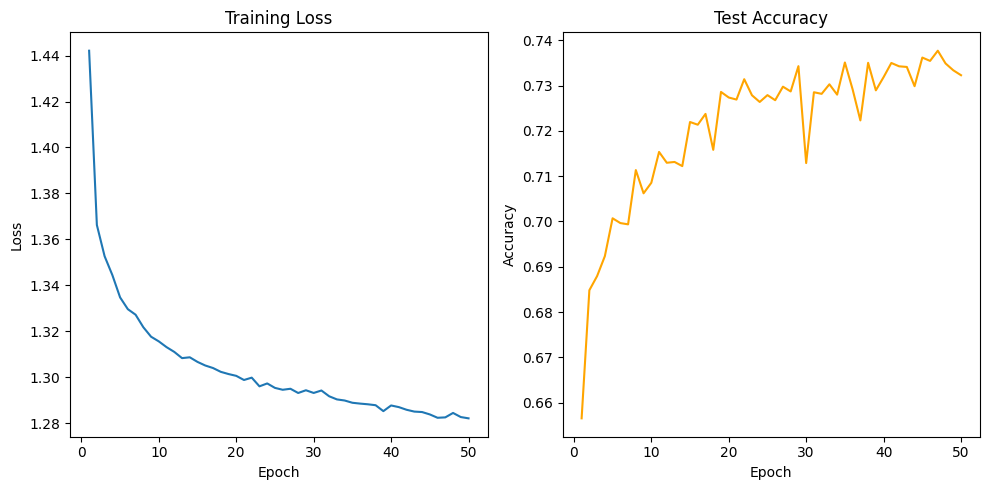

In [70]:
import matplotlib.pyplot as plt

# Initialize empty lists to store loss and accuracy for each epoch
train_loss_history = []
test_accuracy_history = []

# Train the model
for epoch in range(epochs):
    epoch_loss = 0.0
    for i in range(0, len(X_train_tensor), batch_size):
        inputs = X_train_tensor[i:i+batch_size]
        labels = y_train_encoded[i:i+batch_size]  # Using y_train_encoded
        
        # Zero the parameter gradients
        optimizer.zero_grad()

        # Forward pass
        outputs = model(inputs)

        # Convert labels to PyTorch tensor
        labels_tensor = torch.tensor(labels)

        # Compute the loss
        loss = criterion(outputs, labels_tensor)
        
        # Accumulate epoch loss
        epoch_loss += loss.item() * inputs.size(0)

        # Backward pass
        loss.backward()

        # Optimize
        optimizer.step()
    
    # Calculate average epoch loss
    epoch_loss /= len(X_train_tensor)
    train_loss_history.append(epoch_loss)

    # Evaluate the model on test data
    with torch.no_grad():
        model.eval()
        outputs = model(X_test_tensor)
        _, predicted = torch.max(outputs, 1)
        accuracy = ((np.array(predicted)) == (y_test_encoded)).sum().item() / len(y_test_tensor)
        test_accuracy_history.append(accuracy)

    print(f'Epoch [{epoch+1}/{epochs}], Loss: {epoch_loss:.4f}, Test Accuracy: {accuracy:.4f}')

# Plot loss and accuracy curves
plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.plot(range(1, epochs + 1), train_loss_history, label='Train Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training Loss')

plt.subplot(1, 2, 2)
plt.plot(range(1, epochs + 1), test_accuracy_history, label='Test Accuracy', color='orange')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.title('Test Accuracy')

plt.tight_layout()
plt.show()


<h3 style="color:#8B0000;"> Evaluate the model on test data: </h3>

In [71]:

# Evaluate the model on test data
with torch.no_grad():
    model.eval()
    outputs = model(X_test_tensor)
    _, predicted = torch.max(outputs, 1)
    accuracy = ((np.array(predicted)) == (y_test_encoded)).sum().item() / len(y_test_tensor)

# Print the test accuracy of the deep learning model
print('Test Accuracy:', accuracy)


Test Accuracy: 0.7323205682737279


##### 3. Deep Learning Model using pytorch:

- **Model Description:** The deep learning model defined using PyTorch consists of multiple fully connected layers (also known as dense layers) with ReLU activation functions and dropout layers for regularization. The model architecture comprises an input layer, followed by several hidden layers, and an output layer with a softmax activation function. This architecture is commonly used for classification tasks.

- **Why it was Used:** Deep learning models, such as neural networks, are capable of learning complex patterns and relationships within data. They can capture intricate features and interactions, making them suitable for a wide range of classification problems.

- **Evaluation:** The model was trained using a training dataset and evaluated on a separate test dataset. During training, the model's performance was monitored using the loss function.

- **Test Accuracy:** The test accuracy of the deep learning model was approximately 73.53%. This indicates that the model correctly classified around 73.53% of the instances in the test dataset.

- **Loss and Accuracy Curves:** The loss and accuracy curves were plotted to visualize the training process. The loss curve shows the decrease in loss (or error) over epochs, while the accuracy curve illustrates the improvement in model accuracy during training. 


**The Deep Learning Model using pytorch outperformed both the Random Forest Classifier and KNN classifier  in terms of accuracy, achieving the highest accuracy of 73.53%.**

<h1 style="color:#black;font-size:30px"> Unsupervised learning: Clustering Techniques:</h1>

<h3 style="color:#8B0000;"> Read the Data set again for clustering and save into a pandas Data Frame :</h3>


In [72]:
df_ = pd.read_csv('elektronisk-rapportering-ers-2018-fangstmelding-dca-simple.csv', sep = ';')

**Reading data set againn :**

- The dataset was read from the CSV file again, and the column names were converted from Norwegian to English for better understanding and consistency.

<h3 style="color:#8B0000;">Convert column names from Norwegian to English:</h3>

In [73]:
norwegian_to_english = [
    "Message ID",
    "Message timestamp",
    "Message date",
    "Message time",
    "Start timestamp",
    "Start date",
    "Start time",
    "Start position latitude",
    "Start position longitude",
    "Main area start (code)",
    "Main area start",
    "Location start (code)",
    "Water depth start",
    "Stop timestamp",
    "Stop date",
    "Stop time",
    "Duration",
    "Fishing gear",
    "Stop position latitude",
    "Stop position longitude",
    "Main area stop (code)",
    "Main area stop",
    "Location stop (code)",
    "Water depth stop",
    "Trawl distance",
    "Gear FAO (code)",
    "Gear FAO",
    "Gear FDIR (code)",
    "Gear FDIR",
    "Main species FAO (code)",
    "Main species FAO",
    "Main species - FDIR (code)",
    "Species FAO (code)",
    "Species FAO",
    "Species - FDIR (code)",
    "Species - FDIR",
    "Species - group (code)",
    "Species - group",
    "Round weight",
    "Length group (code)",
    "Length group",
    "Gross tonnage 1969",
    "Gross tonnage other",
    "Width",
    "Vessel length"
]


df_.columns = norwegian_to_english
df_.columns

Index(['Message ID', 'Message timestamp', 'Message date', 'Message time',
       'Start timestamp', 'Start date', 'Start time',
       'Start position latitude', 'Start position longitude',
       'Main area start (code)', 'Main area start', 'Location start (code)',
       'Water depth start', 'Stop timestamp', 'Stop date', 'Stop time',
       'Duration', 'Fishing gear', 'Stop position latitude',
       'Stop position longitude', 'Main area stop (code)', 'Main area stop',
       'Location stop (code)', 'Water depth stop', 'Trawl distance',
       'Gear FAO (code)', 'Gear FAO', 'Gear FDIR (code)', 'Gear FDIR',
       'Main species FAO (code)', 'Main species FAO',
       'Main species - FDIR (code)', 'Species FAO (code)', 'Species FAO',
       'Species - FDIR (code)', 'Species - FDIR', 'Species - group (code)',
       'Species - group', 'Round weight', 'Length group (code)',
       'Length group', 'Gross tonnage 1969', 'Gross tonnage other', 'Width',
       'Vessel length'],
      dtype=

<h3 style="color:#8B0000;"> Drop the unnecessary Columns from the data frame:</h3>

In [74]:
df_.drop(['Message ID','Message timestamp', 'Message date', 'Message time', 'Start timestamp', 'Start date', 'Start time','Main area start', 'Gross tonnage other', 'Gross tonnage 1969', 'Species - group','Main area stop', 'Stop timestamp', 'Stop date', 'Stop time','Fishing gear','Gear FAO', 'Gear FAO (code)','Gear FDIR','Length group','Main species FAO (code)','Main species FAO','Species FAO (code)','Species FAO','Species - FDIR',], axis = 1, inplace = True)


**Removing Unnecessary Columns:**

- Columns deemed unnecessary for clustering analysis, such as message-related details, timestamps, fishing gear specifics, and certain identifiers, were dropped from the dataframe.

<h3 style="color:#8B0000;">Check if there are any duplicates:</h3>

In [75]:
print(f'we have : {df_.duplicated().sum()} duplicated values ')

we have : 120 duplicated values 


<h3 style="color:#8B0000;">Drop the duplicate from the data frame:</h3>

In [76]:
df_.drop_duplicates(inplace = True)

**Handling Duplicates:**

- Duplicated rows were identified and subsequently removed to ensure each instance in the dataset was unique, preventing bias in the clustering process.

<h3 style="color:#8B0000;"> We replaced ',' with '.' in Start position latitude, Start position longitude, Stop position latitude and Stop position longitude' columns and convert them to float values:</h3>

In [77]:
# Replacing commas with periods and converting 'Start position latitude' to float
df_['Start position latitude'] = Replace_comma_period(df_, 'Start position latitude')

# Replacing commas with periods and converting 'Start position longitude' to float
df_['Start position longitude'] = Replace_comma_period(df_, 'Start position longitude')

# Replacing commas with periods and converting 'Stop position latitude' to float
df_['Stop position latitude'] = Replace_comma_period(df_, 'Stop position latitude')

# Replacing commas with periods and converting 'Stop position longitude' to float
df_['Stop position longitude'] = Replace_comma_period(df_, 'Stop position longitude')


<h3 style="color:#8B0000;"> We replaced ',' with '.' in Width and Vessel length columns and convert them to float values:</h3>

In [78]:
# Replacing commas with periods and converting 'Width' to float
df_['Width'] = Replace_comma_period(df_, 'Width')

# Replacing commas with periods and converting 'Vessel length' to float
df_['Vessel length'] = Replace_comma_period(df_, 'Vessel length')


**Replacing Commas and Data Type Conversion:**

- Commas in numeric columns representing latitude, longitude, width, and vessel length were replaced with periods to ensure compatibility for numerical operations.

<h3 style="color:#8B0000;"> Drop the missing values for all the remaining columns :</h3>

In [79]:
df_.dropna(inplace = True)
df_ = df_.reset_index(drop = True)

<h3 style="color:#8B0000;"> Now recheck the presence of the missing values:</h3>


In [80]:
df_.isnull().sum()

Start position latitude       0
Start position longitude      0
Main area start (code)        0
Location start (code)         0
Water depth start             0
Duration                      0
Stop position latitude        0
Stop position longitude       0
Main area stop (code)         0
Location stop (code)          0
Water depth stop              0
Trawl distance                0
Gear FDIR (code)              0
Main species - FDIR (code)    0
Species - FDIR (code)         0
Species - group (code)        0
Round weight                  0
Length group (code)           0
Width                         0
Vessel length                 0
dtype: int64


**Handling Missing Values:**

- Any remaining missing values in the dataset were dropped to maintain data integrity and ensure robust clustering results.

<h3 style="color:#8B0000;"> M * N Matrix for the clustering model:</h3>

In [81]:
df_.head()

,Start position latitude,Start position longitude,Main area start (code),Location start (code),Water depth start,Duration,Stop position latitude,Stop position longitude,Main area stop (code),Location stop (code),Water depth stop,Trawl distance,Gear FDIR (code),Main species - FDIR (code),Species - FDIR (code),Species - group (code),Round weight,Length group (code),Width,Vessel length
0,74.885,16.048,20.0,7.0,-335,295,74.914,15.969,20.0,7.0,-334,3970.0,51.0,1027.0,1027.0,202.0,9594.0,5.0,12.6,56.8
1,74.885,16.048,20.0,7.0,-335,295,74.914,15.969,20.0,7.0,-334,3970.0,51.0,1027.0,1022.0,201.0,8510.0,5.0,12.6,56.8
2,74.885,16.048,20.0,7.0,-335,295,74.914,15.969,20.0,7.0,-334,3970.0,51.0,1027.0,2313.0,301.0,196.0,5.0,12.6,56.8
3,74.885,16.048,20.0,7.0,-335,295,74.914,15.969,20.0,7.0,-334,3970.0,51.0,1027.0,1032.0,203.0,134.0,5.0,12.6,56.8
4,74.910,15.868,20.0,7.0,-403,267,74.901,16.248,20.0,7.0,-277,11096.0,51.0,1027.0,1027.0,202.0,9118.0,5.0,12.6,56.8


<h3 style="color:#8B0000;"> Standardize the values of all columns using StandardScaler:</h3>

In [82]:
# Importing the StandardScaler class from the sklearn.preprocessing module
from sklearn.preprocessing import StandardScaler

# Creating an instance of the StandardScaler
scaler = StandardScaler()

# Scaling the DataFrame 'df' and storing the scaled values in 'df_scaled'
df_scaled = scaler.fit_transform(df_)


In [84]:
df_scaled

array([[ 1.30219376,  0.15802046,  0.43578857, ...,  0.61102225,
         0.72524541,  0.72674544],
       [ 1.30219376,  0.15802046,  0.43578857, ...,  0.61102225,
         0.72524541,  0.72674544],
       [ 1.30219376,  0.15802046,  0.43578857, ...,  0.61102225,
         0.72524541,  0.72674544],
       ...,
       [ 1.61896588, -0.11330341,  0.51323169, ...,  0.61102225,
         0.72524541,  0.75426997],
       [ 1.61896588, -0.11330341,  0.51323169, ...,  0.61102225,
         0.72524541,  0.75426997],
       [ 1.61896588, -0.11330341,  0.51323169, ...,  0.61102225,
         0.72524541,  0.75426997]])

**Standardization:**

- The values of all remaining columns were standardized using the StandardScaler from scikit-learn. This step  to bring all features to a similar scale, preventing features with larger magnitudes from dominating the clustering process.

<h3 style="color:#8B0000;"> The Elbow Method:</h3>
In the Elbow method, we initialise k-means and use the inertia attribute to identify the sum of squared distances of samples to the nearest cluster centre.</n>
As k increases, the sum of squared distance tends to zero. Imagine we set k to its maximum value n (where n is number of samples) each sample will form its own cluster meaning sum of squared distances equals zero.</n>
we plot of sum of squared distances for k in the range specified above. If the plot looks like an arm, then the elbow on the arm is optimal k.


<h3 style="color:#8B0000;"> Finding the Sum of squared distances:</h3>


In [86]:
#!pip install --upgrade threadpoolctl
import os

# Set the environment variable to limit the number of threads for BLAS libraries
os.environ["OMP_NUM_THREADS"] = "1"

from sklearn.cluster import KMeans
Sum_of_squared_distances = []
K = range(1,10)
for k in K:
    km = KMeans(n_clusters=k)
    km = km.fit(df_scaled)
    Sum_of_squared_distances.append(km.inertia_)

<h3 style="color:#8B0000;"> Ploting the Sum of squared distances::</h3>



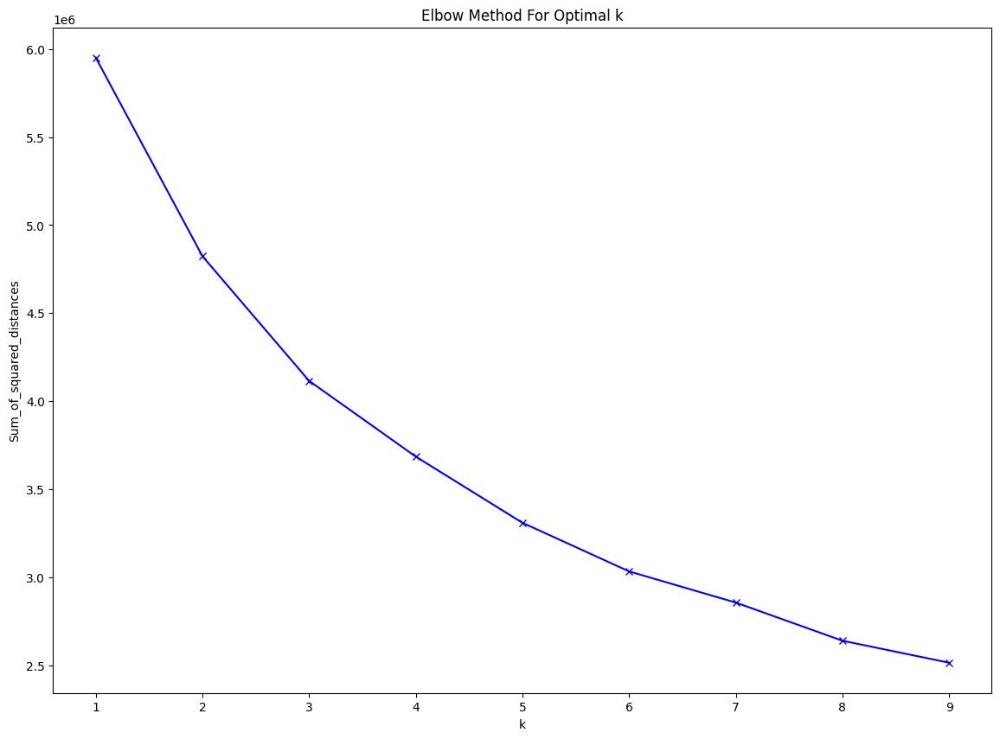

In [87]:
# Create a new figure with a specific size
plt.figure(figsize=(14, 10))

# Plot the values of K (number of clusters) against the sum of squared distances for each K
plt.plot(K, Sum_of_squared_distances, 'bx-')

# Set the label for the x-axis
plt.xlabel('k')

# Set the label for the y-axis
plt.ylabel('Sum_of_squared_distances')

# Set the title of the plot
plt.title('Elbow Method For Optimal k')

# Display the plot
plt.show()


##### As in the above plot we can see the plot have the first arm elbow  at 3 hence the optimal number of clusters in our case is 3:

- **Elbow Method for Optimal K Selection:**

    - The Elbow method was utilized to determine the optimal number of clusters (K) for KMeans clustering.
    - Sum of squared distances was computed for different values of K, ranging from 1 to 10.
    - By plotting the values of K against the sum of squared distances, an elbow point was identified in the plot.

    - In this case, the optimal K was found to be 3, indicating that the dataset can be effectively clustered into three distinct groups.

<h3 style="color:#8B0000;">Hence we Import KMeans from sklearn and fit it using k=3 clusters on our data set:</h3>

In [89]:
# Import the KMeans class from the sklearn.cluster module
from sklearn.cluster import KMeans

# Initialize a KMeans object with specified parameters
km = KMeans(
     # Number of clusters to form
    n_clusters=3, 
     # Method for initializing centroids
    init='random', 
     # Number of times the k-means algorithm will be run with different centroid seeds
    n_init=10, 
    # Maximum number of iterations for each run
    max_iter=300,  
    # Tolerance to declare convergence
    tol=1e-04,  
    # Random seed for centroid initialization
    random_state=0  
)

# Fit the KMeans model to the scaled data
km = km.fit(df_scaled)


- **KMeans Clustering with Optimal K:**

    - KMeans clustering was performed using the optimal K value of 3.
    - Centroid values were generated for each cluster, representing the mean coordinates of the data points within each cluster.
    - Data points were assigned to clusters based on their proximity to the cluster centroids.

<h3 style="color:#8B0000;">The centroid values generated by the algorithm:</h3>


In [90]:
km.cluster_centers_

array([[-0.96382634, -1.25379361,  1.8935089 ,  1.69465427, -0.25063392,
        -0.0542943 , -0.96521388, -1.25594799,  1.89203781,  1.69494437,
        -0.25163992, -0.05572961, -0.46810906, -0.34692789, -0.29445601,
        -0.16286401,  0.45202024,  0.28159064,  0.1238916 ,  0.19093562],
       [-0.58228101, -0.32299224, -0.50109019, -0.2122164 ,  0.17361588,
        -0.03311148, -0.58257265, -0.32182616, -0.50547107, -0.2120172 ,
         0.18094763,  0.19242577,  0.02722151,  0.23589934, -0.03011417,
        -0.0271236 , -0.10654801, -0.70865097, -0.73614863, -0.74107585],
       [ 0.89431575,  0.75316322, -0.20378299, -0.40543952, -0.07432449,
         0.0506717 ,  0.89508713,  0.7528324 , -0.19912085, -0.4057313 ,
        -0.08088722, -0.16175853,  0.14163838, -0.09870686,  0.13369489,
         0.08382973, -0.06099001,  0.56841699,  0.65075352,  0.63143868]])

<h3 style="color:#8B0000;"> The labels for each  data point belongs to:</h3>


In [91]:
print(km.labels_)

[2 2 2 ... 2 2 2]


<h3 style="color:#8B0000;"> The unique values of  clusters labels:</h3>


In [92]:
pd.Series(km.labels_).unique()

array([2, 1, 0])

<h3 style="color:#8B0000;">  Let's plot the points along with the centroid coordinates of each cluster to see how the centroid positions effects clustering:</h3>


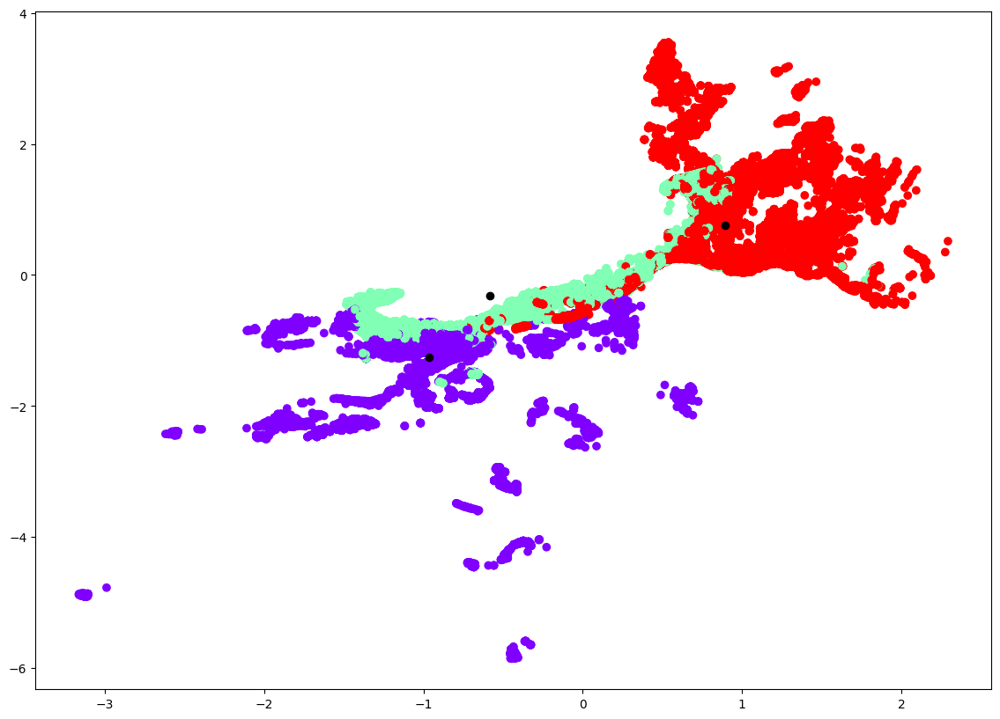

In [93]:
# Create a new figure with specified size
plt.figure(figsize=(14, 10))

# Scatter plot of the scaled data points, coloring them according to their cluster labels
plt.scatter(df_scaled[:, 0], df_scaled[:, 1], c=km.labels_, cmap='rainbow')

# Plot the cluster centers as black points
plt.scatter(km.cluster_centers_[:, 0], km.cluster_centers_[:, 1], color='black')


- **Visualization of Clusters:**

    - The data points along with the centroid coordinates of each cluster were visualized using scatter plots.
    - Data points were color-coded according to their assigned cluster labels, allowing for visual inspection of cluster separation.
    - Centroid coordinates were plotted as black points, providing insight into the central tendency of each cluster.

<h3 style="color:#8B0000;"> Reduce the Dimentions of the data using Principal Component Analysis (PCA) and perform Kmeans again:</h3>

In [94]:
# Import the PCA module from sklearn.decomposition
from sklearn.decomposition import PCA

# Import Axes3D from mpl_toolkits.mplot3d to enable 3D plotting
from mpl_toolkits.mplot3d import Axes3D 

# Initialize a PCA object specifying the number of principal components to retain
pca = PCA(n_components=2)

# Perform PCA transformation on the scaled data
after_pca = pca.fit_transform(df_scaled)


<h3 style="color:#8B0000;"> We fit KMeans again after PCA:</h3>

In [95]:
# Import KMeans from sklearn.cluster module
from sklearn.cluster import KMeans

# Initialize a KMeans object with specified parameters
km = KMeans(
    n_clusters=3, init='random',
    n_init=10, max_iter=300, 
    tol=1e-04, random_state=0
)

# Fit the KMeans model to the data after PCA transformation
km = km.fit(after_pca)


<h3 style="color:#8B0000;">The centroid values generated by the algorithm after PCA:</h3>


In [96]:
km.cluster_centers_

array([[-1.84249252,  1.0475437 ],
       [ 3.72243963,  1.47769164],
       [ 0.37962623, -1.68092294]])

<h3 style="color:#8B0000;">  plot the points along with the centroid coordinates of each cluster after PCA:</h3>


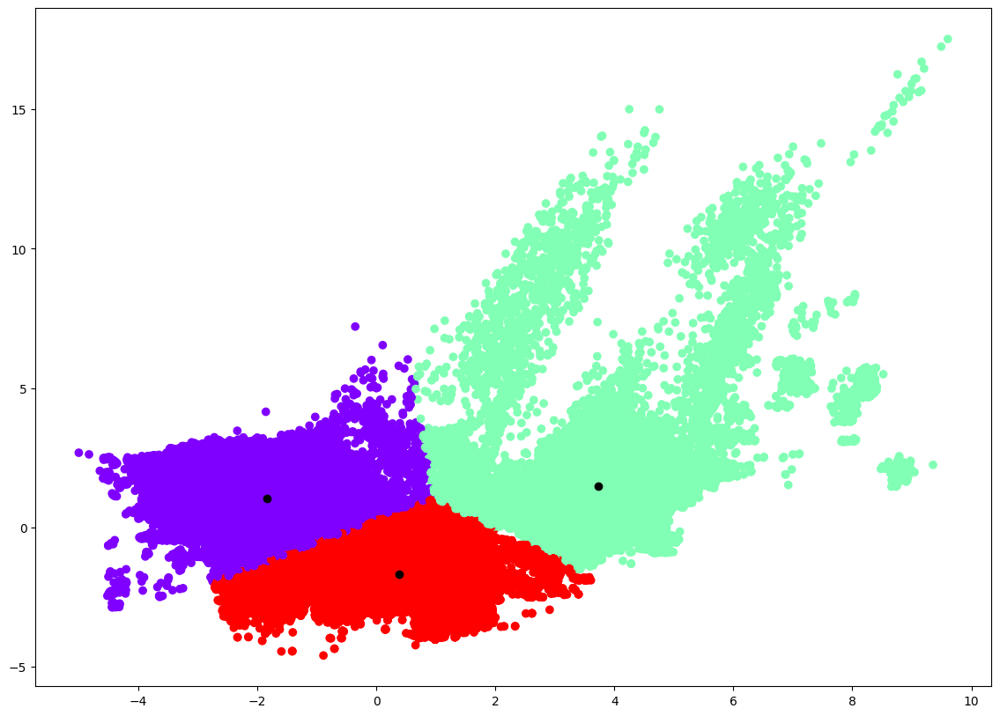

In [97]:
# Create a figure with specified size
plt.figure(figsize = (14,10))

# Scatter plot of data points after PCA transformation, color-coded by cluster labels
plt.scatter(after_pca[:,0], after_pca[:,1], c=km.labels_, cmap='rainbow')

# Scatter plot of cluster centers
plt.scatter(km.cluster_centers_[:,0] ,km.cluster_centers_[:,1], color='black')


- **Dimensionality Reduction with PCA:**

    - Principal Component Analysis (PCA) was employed to reduce the dimensionality of the dataset while retaining essential information.
    - PCA transformation was applied to the scaled data, reducing it to two principal components.
    - KMeans clustering was performed again on the transformed data to observe how PCA affected cluster formation.
    - The centroid values generated after PCA reflected the reduced-dimensional space, aiding in the interpretation of cluster positions.

### Unsupervised learning: Clustering Techniques Summary:


Hence, the combination of the Elbow method for selecting optimal K, KMeans clustering, and PCA for dimensionality reduction provided valuable insights into the underlying structure of the dataset. And helped to find the groups for the reports of fishry operations performed. 